# Project M2: Audio Classification with Neural Networks
Goal of this project was to gain first experiences in audio classification with neural networks and the involved libraries and techniques.

In order to avoid wasting too much time on data gathering, data preparation and data cleansing two different popular benchmark datasets have been used:
1) AudioMNIST (-> More of a beginners dataset)
2) Environmental Sound Classification (ESC-10) (-> A more advanced dataset)

In [1]:
import warnings
warnings.filterwarnings('ignore')

from pathlib import Path
import os
from tqdm import tqdm
import json

from IPython.display import Audio
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
import numpy as np

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
import tensorflow as tf
from tensorflow.keras.layers import Dense, Flatten, Conv2D, Dropout, MaxPool2D, BatchNormalization
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
import tensorflow_hub as hub

# Special libraries for audio processing
import librosa, librosa.display # Important library in audio processing
from audiomentations import Compose, AddGaussianNoise, TimeStretch, PitchShift, Shift, Gain # Interesting library for audio data augmentation
import soundfile as sf # Writing wav files

## 1. AudioMNIST

The first part of this notebook builds models based on the <b>AudioMNIST</b> dataset. The dataset was introduced by Becker et al. (2019) as an equivalent the standard benchmark dataset commonly used in image classification tasks (e.g. MNIST, CIFAR).

Paper: https://arxiv.org/pdf/1807.03418.pdf  
Original Dataset: https://github.com/soerenab/AudioMNIST  

Brief description of data:
- 60 different speakers
- Every speaker speaks number 0 to 9, each number 50 times
- 30'000 records in total
- All Audios have sampling frequency of 48kHz and were saved in 16 bit integer format
- Audio file names are stored with following pattern: "{speakerid/{number}\_\{speakerid}\_\{sampleid}.wav", e.g. Speaker 1, Number 0, Sample 1: "01/00_01_0"
- audioMNIST_meta.txt contains information on accent, age, gender, native speaker flag, origin and recording date

### 1.1. EDA

In [2]:
source_path = Path('../AudioMNIST/data')
metadata_path = os.path.join('../AudioMNIST/audioMNIST_meta.txt')

In [5]:
# Load metadata
metadata = metaData = json.load(open(metadata_path))
metadata_df = pd.DataFrame.from_dict(metadata, orient='index')
metadata_df.head()

,accent,age,gender,native speaker,origin,recordingdate,recordingroom
01,german,30,male,no,"Europe, Germany, Wuerzburg",17-06-22-11-04-28,Kino
02,German,25,male,no,"Europe, Germany, Hamburg",17-06-26-17-57-29,Kino
03,German,31,male,no,"Europe, Germany, Bremen",17-06-30-17-34-51,Kino
04,German,23,male,no,"Europe, Germany, Helmstedt",17-06-30-18-09-14,Kino
05,German,25,male,no,"Europe, Germany, Hameln",17-07-06-10-53-10,Kino


In [3]:
example_path = os.path.join(source_path, '01/0_01_0.wav')

signal, sr = librosa.load(example_path, sr=None) # sr=None; load file with original sampling rate
print('Sampling rate: ', sr)
duration = librosa.get_duration(signal, sr=sr)
print('Duration: ', duration)

Sampling rate:  48000
Duration:  0.7474375


In [4]:
signal.shape

(35877,)

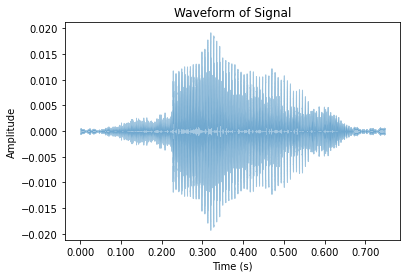

In [5]:
# Librosa gives normalized amplitude of input data, scipy wavefile does not: https://stackoverflow.com/questions/50062358/difference-between-load-of-librosa-and-read-of-scipy-io-wavfile

'''
Waveform visualization is called the time-domain representation of a given signal. 
Shows loudness (amplitude) of sound wave changing with time. 
Amplitude = 0 = silence
'''

librosa.display.waveshow(signal, sr=sr, alpha=0.4)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Waveform of Signal')
plt.show()

In [6]:
signal

array([0.00045776, 0.00042725, 0.00045776, ..., 0.0005188 , 0.0005188 ,
       0.0005188 ], dtype=float32)

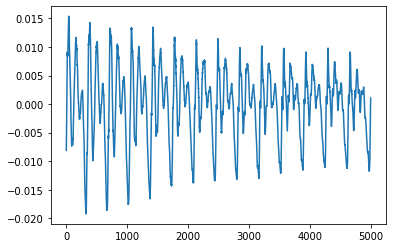

In [7]:
plt.plot(signal[15000:20000])

In [8]:
Audio(signal, rate=sr)

In [11]:
# Check signal length distribution over all files
raw_data = []

for speaker in tqdm(os.listdir(source_path)):
          
    speaker_path = os.path.join(source_path, speaker)

    for file in os.listdir(speaker_path):

        file_path = os.path.join(speaker_path, file)
        digit = file[:1]
        repetition = int(file.strip('.wav').split('_')[2])
        signal, sr = librosa.load(file_path, sr=None) # None = Use original SR
        
        raw_data.append({
            'speaker': speaker,
            'digit': digit,
            'repetition': repetition,
            'file': file,
            'signal': signal,
            'signal_length': len(signal),
            'org_sampling_rate': sr
        })
        
        
raw_data_df = pd.DataFrame(raw_data).sort_values(by=['speaker', 'digit', 'repetition'])
raw_data_df.head()

100%|██████████| 60/60 [00:17<00:00,  3.38it/s]


,speaker,digit,repetition,file,signal,signal_length,org_sampling_rate
0,01,0,0,0_01_0.wav,"[0.00045776367, 0.0004272461, 0.00045776367, 0...",35877,48000
1,01,0,1,0_01_1.wav,"[6.1035156e-05, 6.1035156e-05, 6.1035156e-05, ...",31356,48000
12,01,0,2,0_01_2.wav,"[-0.00088500977, -0.00088500977, -0.0008850097...",37103,48000
23,01,0,3,0_01_3.wav,"[9.1552734e-05, 6.1035156e-05, 9.1552734e-05, ...",39389,48000
34,01,0,4,0_01_4.wav,"[0.00076293945, 0.00076293945, 0.00076293945, ...",29544,48000


In [12]:
# All signals are shorter than 1 second, i.e. signal_length < org_sampling_rate
# All signals have org_sampling_rate of 48kHz
raw_data_df.describe()

,repetition,signal_length,org_sampling_rate
count,30000.00000,30000.000000,30000.0
mean,24.50000,30844.475533,48000.0
std,14.43111,5334.715104,0.0
min,0.00000,14073.000000,48000.0
25%,12.00000,26909.750000,48000.0
50%,24.50000,30336.000000,48000.0
75%,37.00000,34380.000000,48000.0
max,49.00000,47998.000000,48000.0


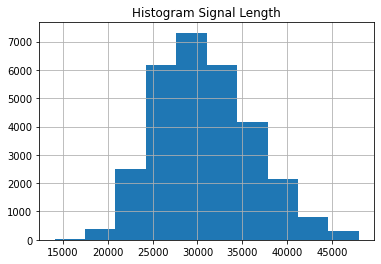

In [13]:
# Histogram of signal length -> we have to adjust all signals to same length later in preprocessing
raw_data_df['signal_length'].hist()
plt.title('Histogram Signal Length')
plt.show()

### 1.2. STFT, Spectrograms and MFCC

Instead of using the waveform representation of the audio signal, the spectrogram is used as an input feature for deep neural networks. Spectrograms are built on top of Short Time Fourier Transform (STFT) and combine the time domain and frequency domain of a audio signal.

<b>Illustration Fourier Transform</b>

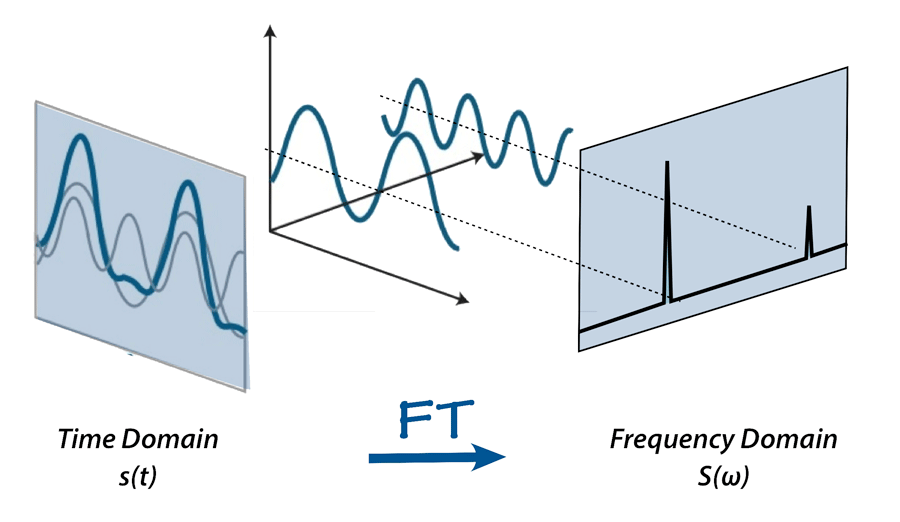

Source: https://towardsdatascience.com/understanding-audio-data-fourier-transform-fft-spectrogram-and-speech-recognition-a4072d228520

<b>Illustration STFT</b>

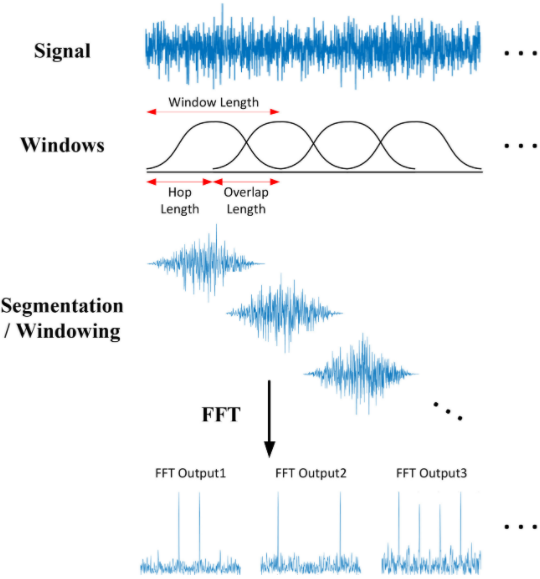

Source: https://towardsdatascience.com/audio-deep-learning-made-simple-part-3-data-preparation-and-augmentation-24c6e1f6b52

Text(0, 0.5, 'Amplitude')

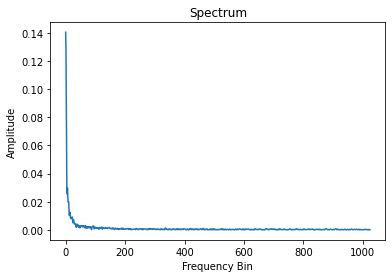

In [13]:
# Plot of signal in frequency dimension with STFT
# See https://www.tutorialexample.com/understand-n_fft-hop_length-win_length-in-audio-processing-librosa-tutorial/
# FFT alone is not useful, since we capture the whole time series in frequency domain and loss time information, so we neede STFT

# In this example we take reduce our signal to window-size and perform stft with no overlapping
n_fft = 512 # frame size recommended for speach... 
ft = np.abs(librosa.stft(signal[:n_fft], hop_length=n_fft+1)) # No overlapping in this plot
plt.plot(ft)
plt.title('Spectrum')
plt.xlabel('Frequency Bin')
plt.ylabel('Amplitude')

<b>Spectrogram</b>

A spectrogram brings together the frequency domain (as frequency bins on y-axis) from the STFT and the time domain from the waveform (on x-axis). As a third dimension it shows the energy of the signal in terms of decibel (DB).

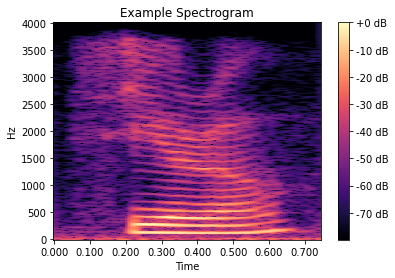

Shape Signal:  (5980,)
Shape STFT:  (257, 171)


In [14]:
# Example Normal Spectrogram
signal, sr = librosa.load(example_path, sr=8000) 

stft = np.abs(librosa.stft(signal, n_fft=512, hop_length=35)) # We convert all amplitudes to positive values
stft_db = librosa.amplitude_to_db(stft) # Note: This maps amplitude to the logarithmic decibel scale, librosa maps the highest amplitude to db 0, see: https://stackoverflow.com/questions/63347977/what-is-the-conceptual-purpose-of-librosa-amplitude-to-db

librosa.display.specshow(stft_db, y_axis='linear', x_axis='time', sr=sr, hop_length=35) 
plt.title('Example Spectrogram')
plt.colorbar(format='%+2.0f dB')
plt.show()

print('Shape Signal: ', signal.shape)
print('Shape STFT: ', stft_db.shape)

Notes Spectrogram and STFT:
- Higher n_fft (i.e. number of frequency bins) = higher frequency resolution (more frequency bins)
- Smaller hop_length = higher time resolution...
- See: https://music-classification.github.io/tutorial/part2_basics/input-representations.html
- Shape is ((1 + n_fft) / 2, (number of data points / hop_length)).... n_fft defines how the frequency space is divided, i.e. how many frequency bins are created... we only see half of the bins, since FFT is symmetrical, see: https://ch.mathworks.com/matlabcentral/answers/322142-what-are-frequency-bins
- Maximum frequency captured by fft is sr / 2, see: https://www.nti-audio.com/en/support/know-how/fast-fourier-transform-fft#:~:text=The%20sampling%20rate%20or%20sampling,2%5E10%20%3D%201024%20samples)
- 512 recommended for speech (see librosa page)... 
- When hop_length = n_fft, then we have no overlap
- Amplitude to DB applies a Log and DB is always relative and can be negative

<b>Mel spectrogram</b>

A Mel spectrogram uses the concept of the Mel scale to represent the signal in frequency domain. The Mel scale takes into account that humans don't perceive frequency linear, but rather on a logarithmic scale (i.e. the perceived distance between 500Hz and 1000Hz is not the same as between 10500Hz and 11000Hz).

For more details: https://medium.com/analytics-vidhya/understanding-the-mel-spectrogram-fca2afa2ce53

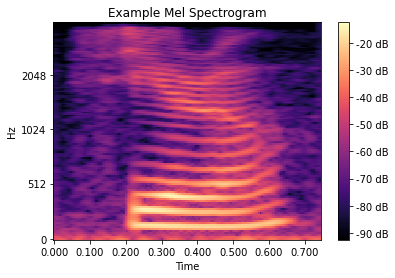

Shape:  (128, 171)


In [15]:
# Example Mel spectrogram
mel = librosa.feature.melspectrogram(signal, sr=sr, n_fft=512, hop_length=35, n_mels=128)
mel_db = librosa.power_to_db(mel)

librosa.display.specshow(mel_db, sr=sr, x_axis='time', y_axis='mel', hop_length=35)
plt.title('Example Mel Spectrogram')
plt.colorbar(format='%+2.0f dB')
plt.show()

print('Shape: ', mel_db.shape)

Notes Mel Spectrogram:
- Power to DB instead amplitude to DB
- Default n_mels in librosa is 128
- Shape is n_mels in rows, time in columns
- More bins more frequency resolution

<b>Mel frequency cepstral coefficients (MFCCs)</b>

A very popular feature representation for audio classificatoin are Mel frequency cepstral coefficients (MFCCs). MFCCs are a small set of coefficents (usually 10-20) extracted from spectrogram representations. It models the characteristics of the human voice and is suited for speech recognition.

"Though the argumentation for the MFCCs is not without problems, it has become the most used feature in speech and audio recognition applications. It is used because it works and because it has relatively low complexity and it is straightforward to implement. <b>Simply stated, if you're unsure which inputs to give to a speech and audio recognition engine, try first the MFCCs.</b>" (https://wiki.aalto.fi/display/ITSP/Cepstrum+and+MFCC)

Details including some math can be found in above link.

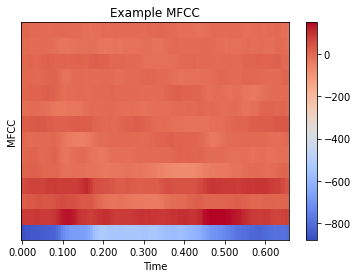

In [188]:
# Example MFCC
mfcc = librosa.feature.mfcc(signal, sr=sr, n_fft=512, hop_length=35, n_mfcc=14)
librosa.display.specshow(mfcc, sr=sr, hop_length=35, x_axis='time')

plt.title('Example MFCC')
plt.xlabel('Time')
plt.ylabel('MFCC')
plt.colorbar()
plt.show()

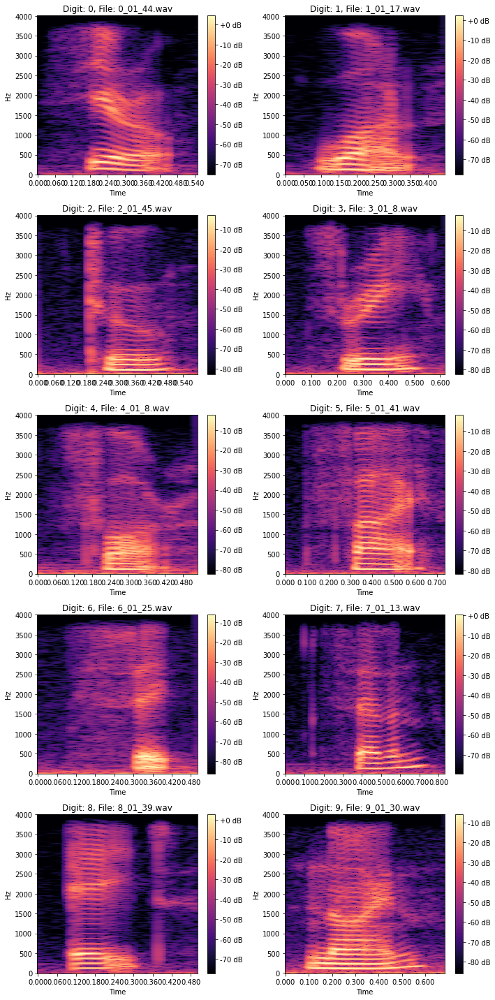

In [17]:
# Create spectrogram plots for example files for digit 0 to 9
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(10, 20))

digits = [i for i in range(10)] # Digit 0 to 9

# loop through digits and axes
for digit, ax in zip(digits, axs.ravel()):
    
    # Load file from speaker 1
    rep = np.random.randint(0,49) # Random repetition    
    file = f'{digit}_01_{rep}.wav'
    example_path = os.path.join(source_path, f'01/{file}')
    signal, sr = librosa.load(example_path, sr=8000) 
    
    # Create spectrogram
    stft = np.abs(librosa.stft(signal, n_fft=512, hop_length=35))
    stft_db = librosa.amplitude_to_db(stft)
    
    # Display spectrogram
    img = librosa.display.specshow(stft_db, y_axis='linear', x_axis='time', ax=ax, sr=sr, hop_length=35)
    
    # Format plot
    ax.set_title(f'Digit: {digit}, File: {file}')
    fig.colorbar(img, ax=ax, format='%+2.0f dB')

fig.tight_layout()
plt.show()

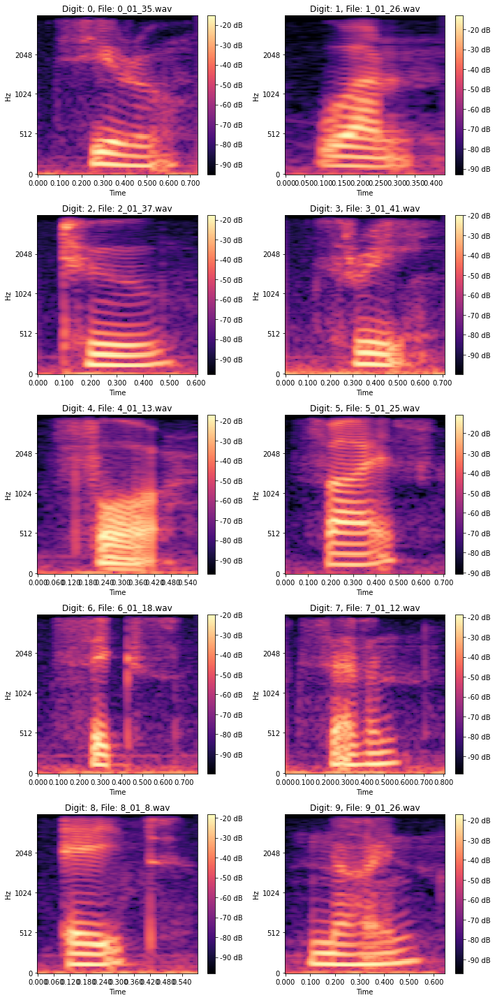

In [18]:
# Create Mel spectrogram plots for example files for digit 0 to 9
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(10, 20))

digits = [i for i in range(10)] # Digit 0 to 9

# loop through digits and axes
for digit, ax in zip(digits, axs.ravel()):
    
    # Load file from speaker 1
    rep = np.random.randint(0,49) # Random repetition    
    file = f'{digit}_01_{rep}.wav'
    example_path = os.path.join(source_path, f'01/{file}')
    signal, sr = librosa.load(example_path, sr=8000) 

    # Create Mel spectrogram
    mel = librosa.feature.melspectrogram(signal, sr=sr, n_fft=512, hop_length=35)
    mel_db = librosa.power_to_db(mel)
    
    # Display spectrogram
    img = librosa.display.specshow(mel_db, x_axis='time', y_axis='mel', ax=ax, sr=sr, hop_length=35)
    
    # Format plot
    ax.set_title(f'Digit: {digit}, File: {file}')
    fig.colorbar(img, ax=ax, format='%+2.0f dB')

fig.tight_layout()
plt.show()

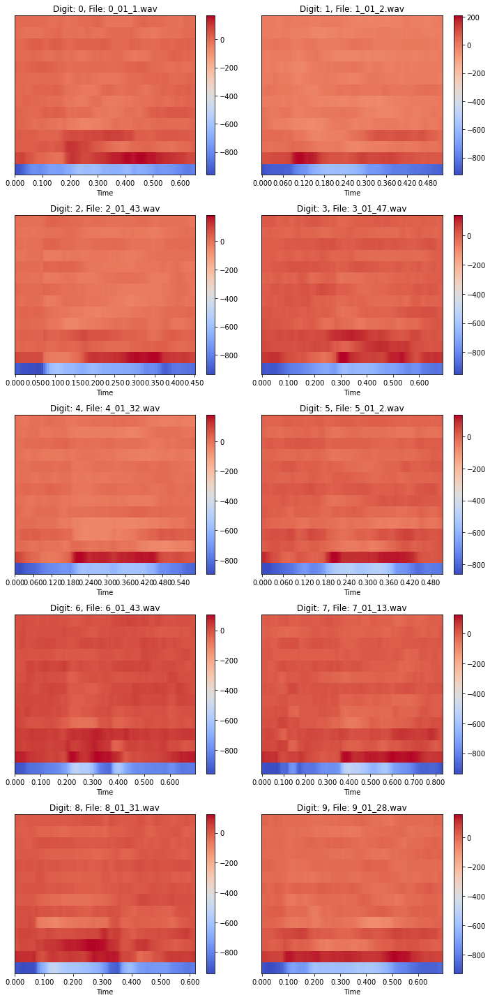

In [19]:
# Create MFCC plots for example files for digit 0 to 9
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(10, 20))

digits = [i for i in range(10)] # Digit 0 to 9

# loop through digits and axes
for digit, ax in zip(digits, axs.ravel()):
    
    # Load file from speaker 1
    rep = np.random.randint(0,49) # Random repetition    
    file = f'{digit}_01_{rep}.wav'
    example_path = os.path.join(source_path, f'01/{file}')
    signal, sr = librosa.load(example_path, sr=8000) 

    # Create MFCC
    mfcc = librosa.feature.mfcc(signal, sr=sr, n_fft=512, hop_length=35, n_mfcc=14)
    
    # Display MFCC
    img = librosa.display.specshow(mfcc, sr=sr, hop_length=35, ax=ax, x_axis='time')
    
    # Format plot
    ax.set_title(f'Digit: {digit}, File: {file}')
    fig.colorbar(img, ax=ax)

fig.tight_layout()
plt.show()

<b>Spectrogram vs. Spectrogram</b>

There is not only one single way to extract a spectrogram (or also MFCCs) from a signal. Instead, there are many parameters that can be changed (e.g. sampling rate, number of frequency bins, hop length) and this results in very different spectrogram representations of a signal.

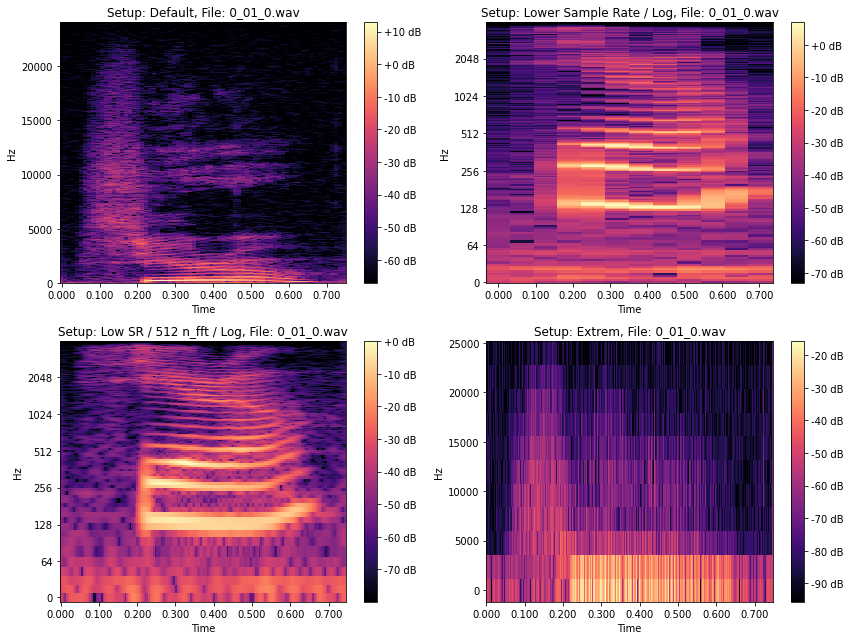

In [190]:
# Show how different spectrograms can look like
setups = [
    {
        'setup': 'Default', 
        'sr': 48000, 
        'n_fft': 2048, 
        'hop_length': 512, 
        'win_length': 2048, 
        'scale': 'linear'
    }, 
    {
        'setup': 'Lower Sample Rate / Log', 
        'sr': 8000, 
        'n_fft': 2048, 
        'hop_length': 512, 
        'win_length': 2048, 
        'scale': 'log'
    }, 
    {
        'setup': 'Low SR / 512 n_fft / Log', 
        'sr': 8000, 
        'n_fft': 512, 
        'hop_length': 35, 
        'win_length': 512, 
        'scale': 'log'
    }, 
    {
        'setup': 'Extrem', 
        'sr': 48000, 
        'n_fft': 20, 
        'hop_length': 35, 
        'win_length': 10, 
        'scale': 'linear'
    }
]

# Create spectrogram plots for example files for digit 0 to 9
file = '0_01_0.wav'
example_path = os.path.join(source_path, f'01/{file}')

fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(12, 9))

# loop through setups and axes
for setup, ax in zip(setups, axs.ravel()):
    
    setup_name = setup['setup']
    
    # Load example file
    signal, sr = librosa.load(example_path, sr=setup['sr']) 
    
    # Create spectrogram
    stft = np.abs(librosa.stft(signal, n_fft=setup['n_fft'], hop_length=setup['hop_length']))
    stft_db = librosa.amplitude_to_db(stft)
    
    # Display spectrogram
    img = librosa.display.specshow(stft_db, y_axis=setup['scale'], x_axis='time', ax=ax, sr=setup['sr'], hop_length=setup['hop_length'])
    
    # Format plot
    ax.set_title(f'Setup: {setup_name}, File: {file}')
    fig.colorbar(img, ax=ax, format='%+2.0f dB')

fig.tight_layout()
plt.show()

### 1.3. Preprocessing

- Reduce data points with resampling to 8000 Hz
- Bring all files to same length, zero padding both ends
- Create spectrograms with Short Time Fourier Transform (STFT)
- Create Mel Spectrograms
- Create Mel-Frequency Cepstral Coefficients (MFCC)

In [16]:
n_fft = 512
hop_length = 35
n_mfcc = 14

In [17]:
# Load with sr = 8000
signal, sr = librosa.load(example_path, sr=8000)
signal.shape

(5980,)

In [193]:
# Padding signal front/back with zeros to 8000
n_zeros = sr - len(signal)
n_zeros_front = int(n_zeros*.5)
n_zeros_back = n_zeros - n_zeros_front
signal_padded = np.pad(signal, (n_zeros_front, n_zeros_back))
signal_padded.shape

(8000,)

In [194]:
# Perform stft and convert to db
stft = np.abs(librosa.stft(signal_padded, n_fft=n_fft, hop_length=hop_length))
stft_db = librosa.amplitude_to_db(stft, ref=np.max)
stft_db.shape

(257, 229)

In [195]:
# Mel Spectrogram
mel = librosa.feature.melspectrogram(signal_padded, sr=sr, n_fft=n_fft, hop_length=hop_length)
mel_db = librosa.power_to_db(mel)
mel_db.shape

(128, 229)

In [196]:
# MFCC
mfcc = librosa.feature.mfcc(signal_padded, n_fft=n_fft, n_mfcc=n_mfcc, hop_length=hop_length)
mfcc.shape

(14, 229)

In [197]:
# Loop through speaker folders and create spectrogram data... we don't need to draw and save images
# Input to Neural Network are not the images, but the spectrogram data
# see https://towardsdatascience.com/audio-deep-learning-made-simple-sound-classification-step-by-step-cebc936bbe5
preprocessed_data = []

for speaker in tqdm(os.listdir(source_path)):
          
    speaker_path = os.path.join(source_path, speaker)

    for file in os.listdir(speaker_path):
        
        # Load file
        file_path = os.path.join(speaker_path, file)
        signal, sr = librosa.load(file_path, sr=8000) # Default sr
        
        # Padding signal
        n_zeros = sr - len(signal)
        n_zeros_front = int(n_zeros*.5)
        n_zeros_back = n_zeros - n_zeros_front
        signal_padded = np.pad(signal, (n_zeros_front, n_zeros_back))
        
        # Create STFT spectrogram and convert to db scale
        stft = np.abs(librosa.stft(signal_padded, n_fft=n_fft, hop_length=hop_length))
        stft_db = librosa.amplitude_to_db(stft, ref=np.max)
        stft_db = stft_db.reshape(1, stft_db.shape[0], stft_db.shape[1])
        
        # Create Mel Spectrogram and convert to db scale
        mel = librosa.feature.melspectrogram(signal_padded, sr=sr, n_fft=n_fft, hop_length=hop_length)
        mel_db = librosa.power_to_db(mel)
        mel_db = mel_db.reshape(1, mel_db.shape[0], mel_db.shape[1])
        
        # Extract MFCCs
        mfcc = librosa.feature.mfcc(signal_padded, sr=sr, n_fft=n_fft, n_mfcc=n_mfcc, hop_length=hop_length)
        mfcc = mfcc.reshape(1, mfcc.shape[0], mfcc.shape[1])
         
        # Get label and repetition
        digit = file[:1]
        repetition = int(file.strip('.wav').split('_')[2])
        
        preprocessed_data.append({
            'speaker': speaker,
            'digit': digit,
            'repetition': repetition,
            'file': file,
            'signal_padded': signal_padded,
            'stft_db': stft_db,
            'mel_db': mel_db,
            'mfcc': mfcc
        })
        
preprocessed_data_df = pd.DataFrame(preprocessed_data)
preprocessed_data_df.head()

100%|██████████| 60/60 [29:19<00:00, 29.33s/it]


,speaker,digit,repetition,file,signal_padded,stft_db,mel_db,mfcc
0,01,0,0,0_01_0.wav,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[[-80.0, -80.0, -80.0, -80.0, -80.0, -80.0, -...","[[[-92.53915, -92.53915, -92.53915, -92.53915,...","[[[-1046.9609, -1046.9609, -1046.9609, -1046.9..."
1,01,0,1,0_01_1.wav,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[[-80.0, -80.0, -80.0, -80.0, -80.0, -80.0, -...","[[[-97.5652, -97.5652, -97.5652, -97.5652, -97...","[[[-1103.8242, -1103.8242, -1103.8242, -1103.8..."
2,01,0,10,0_01_10.wav,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[[-80.0, -80.0, -80.0, -80.0, -80.0, -80.0, -...","[[[-88.62083, -88.62083, -88.62083, -88.62083,...","[[[-1002.6302, -1002.6302, -1002.6302, -1002.6..."
3,01,0,11,0_01_11.wav,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[[-80.0, -80.0, -80.0, -80.0, -80.0, -80.0, -...","[[[-90.27966, -90.27966, -90.27966, -90.27966,...","[[[-1021.39777, -1021.39777, -1021.39777, -102..."
4,01,0,12,0_01_12.wav,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[[-80.0, -80.0, -80.0, -80.0, -80.0, -80.0, -...","[[[-93.71318, -93.71318, -93.71318, -93.71318,...","[[[-1060.2435, -1060.2435, -1060.2435, -1060.2..."


In [198]:
# Save data
preprocessed_data_df.to_pickle('preprocessed_data_audiomnist.pkl')

### 1.4. Spectrogram model

In [26]:
# Load preprocessed data
preprocessed_data_df = pd.read_pickle('preprocessed_data_audiomnist.pkl')
preprocessed_data_df.head()

,speaker,digit,repetition,file,signal_padded,stft_db,mel_db,mfcc
0,01,0,0,0_01_0.wav,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[[-80.0, -80.0, -80.0, -80.0, -80.0, -80.0, -...","[[[-92.53915, -92.53915, -92.53915, -92.53915,...","[[[-1046.9609, -1046.9609, -1046.9609, -1046.9..."
1,01,0,1,0_01_1.wav,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[[-80.0, -80.0, -80.0, -80.0, -80.0, -80.0, -...","[[[-97.5652, -97.5652, -97.5652, -97.5652, -97...","[[[-1103.8242, -1103.8242, -1103.8242, -1103.8..."
2,01,0,10,0_01_10.wav,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[[-80.0, -80.0, -80.0, -80.0, -80.0, -80.0, -...","[[[-88.62083, -88.62083, -88.62083, -88.62083,...","[[[-1002.6302, -1002.6302, -1002.6302, -1002.6..."
3,01,0,11,0_01_11.wav,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[[-80.0, -80.0, -80.0, -80.0, -80.0, -80.0, -...","[[[-90.27966, -90.27966, -90.27966, -90.27966,...","[[[-1021.39777, -1021.39777, -1021.39777, -102..."
4,01,0,12,0_01_12.wav,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[[-80.0, -80.0, -80.0, -80.0, -80.0, -80.0, -...","[[[-93.71318, -93.71318, -93.71318, -93.71318,...","[[[-1060.2435, -1060.2435, -1060.2435, -1060.2..."


In [27]:
# Spectrogram feature
X = preprocessed_data_df['stft_db'].values
X = np.concatenate(X, axis=0)
X.shape

(30000, 257, 229)

In [28]:
n_recs = X.shape[0]
n_rows = X.shape[1]
n_cols = X.shape[2]

In [30]:
X = X.reshape(n_recs, n_rows*n_cols) # Flatten for StandardScaling
X.shape

(30000, 58853)

In [31]:
# Target variable
y = preprocessed_data_df['digit'].values

# To categorical - for softmax multiclass in keras
y = to_categorical(y, num_classes=10)
y.shape

(30000, 10)

In [32]:
# Filenames
files = preprocessed_data_df['file'].values
files.shape

(30000,)

In [33]:
# Train/test split with stratify on y (we want all digits being evenly represented in train and test)
X_train, X_test, y_train, y_test, files_train, files_test = train_test_split(X, y, files, test_size=0.2, stratify=y)
print('X_train: ', X_train.shape)
print('y_train: ', y_train.shape)
print('files_train: ', files_train.shape)
print('X_test: ', X_test.shape)
print('y_test: ', y_test.shape)
print('files_test: ', files_test.shape)

X_train:  (24000, 58853)
y_train:  (24000, 10)
files_train:  (24000,)
X_test:  (6000, 58853)
y_test:  (6000, 10)
files_test:  (6000,)


In [11]:
# Proof we shuffled all the files (digit, speaker and repetition)
files_train[:20]

array(['5_47_0.wav', '3_24_44.wav', '8_57_42.wav', '4_50_45.wav',
       '9_01_33.wav', '8_14_38.wav', '4_39_18.wav', '9_38_42.wav',
       '3_15_37.wav', '8_16_43.wav', '7_15_33.wav', '5_19_27.wav',
       '9_27_8.wav', '6_38_32.wav', '5_58_5.wav', '2_33_14.wav',
       '8_55_12.wav', '6_25_26.wav', '2_43_36.wav', '1_05_13.wav'],
      dtype=object)

In [12]:
# Proof we shuffled all the files
files_test[:20]

array(['0_45_32.wav', '4_44_30.wav', '8_11_22.wav', '7_17_13.wav',
       '3_42_1.wav', '8_42_47.wav', '7_40_33.wav', '9_37_39.wav',
       '8_31_31.wav', '5_20_8.wav', '5_10_32.wav', '0_22_37.wav',
       '3_42_33.wav', '3_43_36.wav', '5_55_19.wav', '1_36_32.wav',
       '6_21_0.wav', '5_50_4.wav', '6_32_43.wav', '0_27_39.wav'],
      dtype=object)

In [34]:
# Fit StandardScaler on training data
scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

In [35]:
X_train_std = X_train_std.reshape(X_train.shape[0], n_rows, n_cols, 1) # Reshape to 4D - needed for CNN
X_test_std = X_test_std.reshape(X_test.shape[0], n_rows, n_cols, 1)

X_train_std.shape, X_test_std.shape

((24000, 257, 229, 1), (6000, 257, 229, 1))

In [39]:
# Build CNN
model = Sequential([
    Conv2D(filters=32, kernel_size=10, strides=2, padding='same', activation='relu', input_shape=(n_rows, n_cols, 1)),
    MaxPool2D(pool_size=2, strides=2, padding='same'),
    Conv2D(filters=16, kernel_size=5, strides=2, padding='same', activation='relu'),
    MaxPool2D(pool_size=2, strides=2, padding='same'),
    Flatten(),
    #Dropout(0.5),
    Dense(units=30, activation='relu'),
    Dense(units=10, activation='softmax')
])

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 129, 115, 32)      3232      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 65, 58, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 33, 29, 16)        12816     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 17, 15, 16)        0         
_________________________________________________________________
flatten (Flatten)            (None, 4080)              0         
_________________________________________________________________
dense (Dense)                (None, 30)                122430    
_________________________________________________________________
dense_1 (Dense)              (None, 10)                3

In [40]:
# Model checkpoint to save best model
checkpoint_path = 'models/best_model_spec'
checkpoint = ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')

In [41]:
# Compile the model with adam optimizer and default settings
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [42]:
# Fit
history = model.fit(X_train_std, y_train, epochs=5, validation_split=0.2, batch_size=128, callbacks=[checkpoint])

Epoch 1/5
150/150 [==============================] - 167s 1s/step - loss: 0.6787 - accuracy: 0.7867 - val_loss: 0.1199 - val_accuracy: 0.9679

Epoch 00001: val_accuracy improved from -inf to 0.96792, saving model to models\best_model_spec
INFO:tensorflow:Assets written to: models\best_model_spec\assets
Epoch 2/5
150/150 [==============================] - 169s 1s/step - loss: 0.0840 - accuracy: 0.9756 - val_loss: 0.0507 - val_accuracy: 0.9854

Epoch 00002: val_accuracy improved from 0.96792 to 0.98542, saving model to models\best_model_spec
INFO:tensorflow:Assets written to: models\best_model_spec\assets
Epoch 3/5
150/150 [==============================] - 173s 1s/step - loss: 0.0429 - accuracy: 0.9889 - val_loss: 0.0441 - val_accuracy: 0.9892

Epoch 00003: val_accuracy improved from 0.98542 to 0.98917, saving model to models\best_model_spec
INFO:tensorflow:Assets written to: models\best_model_spec\assets
Epoch 4/5
150/150 [==============================] - 166s 1s/step - loss: 0.0253 -

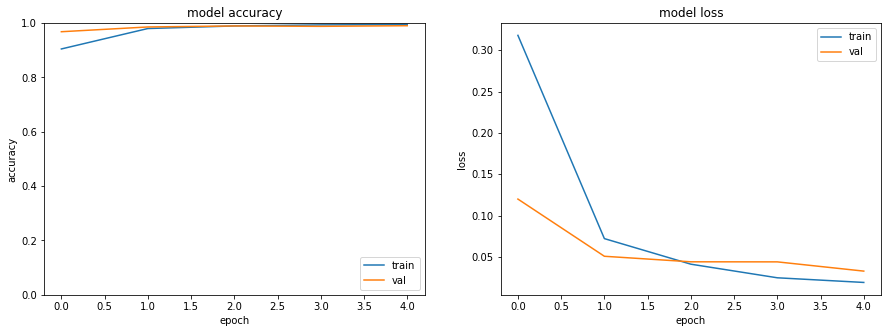

In [43]:
# Plot training history
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

# Plot training accuracy history
axs[0].plot(history.history['accuracy'])
axs[0].plot(history.history['val_accuracy'])
axs[0].set_title('model accuracy')
axs[0].set_ylabel('accuracy')
axs[0].set_xlabel('epoch')
axs[0].set_ylim(0,1)
axs[0].legend(['train', 'val'], loc='lower right')

axs[1].plot(history.history['loss'])
axs[1].plot(history.history['val_loss'])
axs[1].set_title('model loss')
axs[1].set_ylabel('loss')
axs[1].set_xlabel('epoch')
axs[1].legend(['train', 'val'], loc='upper right')

fig.show()

In [44]:
test_loss, test_accuracy = model.evaluate(X_test_std, y_test)

print(f'Test loss: {test_loss}')
print(f'Test accuracy: {test_accuracy}')

188/188 [==============================] - 10s 54ms/step - loss: 0.0375 - accuracy: 0.9903
Test loss: 0.03752470761537552
Test accuracy: 0.9903333187103271


In [45]:
y_pred_proba = model.predict(X_test_std)

y_pred_test = np.array([np.argmax(y) for y in y_pred_proba])
y_pred_test

array([4, 9, 0, ..., 7, 8, 1], dtype=int64)

In [46]:
y_true_test = np.array([np.argmax(y) for y in y_test])
y_true_test

array([4, 9, 0, ..., 7, 8, 1], dtype=int64)

In [47]:
# Classification Report
print(classification_report(y_true_test, y_pred_test))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99       600
           1       0.99      0.99      0.99       600
           2       0.98      0.99      0.99       600
           3       0.98      0.99      0.99       600
           4       0.99      0.99      0.99       600
           5       1.00      0.99      0.99       600
           6       0.99      0.99      0.99       600
           7       0.99      0.99      0.99       600
           8       0.99      0.99      0.99       600
           9       0.99      0.99      0.99       600

    accuracy                           0.99      6000
   macro avg       0.99      0.99      0.99      6000
weighted avg       0.99      0.99      0.99      6000



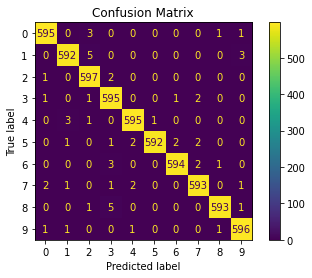

In [48]:
# Confusion matrix
ConfusionMatrixDisplay.from_predictions(y_true_test, y_pred_test)
plt.title('Confusion Matrix')
plt.show()

In [49]:
# Test on real data

# Load data
test_path = Path('testdata/Test_7_01_short.wav')

signal, sr = librosa.load(test_path, sr=None) # sr=None; load file with original sampling rate
print('Sampling rate: ', sr)
duration = librosa.get_duration(signal, sr=sr)
print('Duration: ', duration)

Sampling rate:  48000
Duration:  0.9771041666666667


In [50]:
Audio(signal, rate=sr)

In [51]:
# Preprocess
signal, sr = librosa.load(test_path, sr=8000) # Default sr
        
# Padding signal
n_zeros = sr - len(signal)
n_zeros_front = int(n_zeros*.5)
n_zeros_back = n_zeros - n_zeros_front
signal_padded = np.pad(signal, (n_zeros_front, n_zeros_back))

# Perform sftf and convert to db scale
stft = np.abs(librosa.stft(signal_padded, n_fft=512, hop_length=35))
stft_db = librosa.amplitude_to_db(stft, ref=np.max)
stft_db = stft_db.reshape(1, stft_db.shape[0], stft_db.shape[1])

stft_db.shape

(1, 257, 229)

In [52]:
# Scaling
X_new = stft_db.reshape(1, n_rows * n_cols)
X_new_std = scaler.transform(X_new)
X_new_std = X_new_std.reshape(1, n_rows, n_cols, 1) # Reshape to 4D - needed for CCN

In [53]:
# Test
y_pred_new = model.predict(X_new_std)
np.argmax(y_pred_new)

7

### 1.5. Mel Spectrogram model

In [51]:
# Load preprocessed data
preprocessed_data_df = pd.read_pickle('preprocessed_data_audiomnist.pkl')
preprocessed_data_df.head()

,speaker,digit,repetition,file,signal_padded,stft_db,mel_db,mfcc
0,01,0,0,0_01_0.wav,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[[-80.0, -80.0, -80.0, -80.0, -80.0, -80.0, -...","[[[-92.53915, -92.53915, -92.53915, -92.53915,...","[[[-1046.9609, -1046.9609, -1046.9609, -1046.9..."
1,01,0,1,0_01_1.wav,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[[-80.0, -80.0, -80.0, -80.0, -80.0, -80.0, -...","[[[-97.5652, -97.5652, -97.5652, -97.5652, -97...","[[[-1103.8242, -1103.8242, -1103.8242, -1103.8..."
2,01,0,10,0_01_10.wav,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[[-80.0, -80.0, -80.0, -80.0, -80.0, -80.0, -...","[[[-88.62083, -88.62083, -88.62083, -88.62083,...","[[[-1002.6302, -1002.6302, -1002.6302, -1002.6..."
3,01,0,11,0_01_11.wav,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[[-80.0, -80.0, -80.0, -80.0, -80.0, -80.0, -...","[[[-90.27966, -90.27966, -90.27966, -90.27966,...","[[[-1021.39777, -1021.39777, -1021.39777, -102..."
4,01,0,12,0_01_12.wav,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[[-80.0, -80.0, -80.0, -80.0, -80.0, -80.0, -...","[[[-93.71318, -93.71318, -93.71318, -93.71318,...","[[[-1060.2435, -1060.2435, -1060.2435, -1060.2..."


In [102]:
# Mel spectrogram feature
X = preprocessed_data_df['mel_db'].values
X = np.concatenate(X, axis=0)
X.shape

(30000, 128, 229)

In [103]:
n_recs = X.shape[0]
n_rows = X.shape[1]
n_cols = X.shape[2]

In [104]:
X = X.reshape(n_recs, n_rows*n_cols) # Flatten for StandardScaling
X.shape

(30000, 29312)

In [105]:
# Target variable
y = preprocessed_data_df['digit'].values

# To categorical - for softmax multiclass in keras
y = to_categorical(y, num_classes=10)
y.shape

(30000, 10)

In [106]:
# Filenames
files = preprocessed_data_df['file'].values
files.shape

(30000,)

In [107]:
# Train/test split with stratify on y (we want all digits being evenly represented in train and test)
X_train, X_test, y_train, y_test, files_train, files_test = train_test_split(X, y, files, test_size=0.2, stratify=y)
print('X_train: ', X_train.shape)
print('y_train: ', y_train.shape)
print('files_train: ', files_train.shape)
print('X_test: ', X_test.shape)
print('y_test: ', y_test.shape)
print('files_test: ', files_test.shape)

X_train:  (24000, 29312)
y_train:  (24000, 10)
files_train:  (24000,)
X_test:  (6000, 29312)
y_test:  (6000, 10)
files_test:  (6000,)


In [108]:
# Fit StandardScaler on training data
scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

In [109]:
X_train_std = X_train_std.reshape(X_train.shape[0], n_rows, n_cols, 1) # Reshape to 4D - needed for CCN
X_test_std = X_test_std.reshape(X_test.shape[0], n_rows, n_cols, 1)

X_train_std.shape, X_test_std.shape

((24000, 128, 229, 1), (6000, 128, 229, 1))

In [110]:
# Build simple CNN
model = Sequential([
    Conv2D(filters=32, kernel_size=10, strides=2, padding='same', activation='relu', input_shape=(n_rows, n_cols, 1)),
    MaxPool2D(pool_size=2, strides=2, padding='same'),
    Conv2D(filters=16, kernel_size=5, strides=2, padding='same', activation='relu'),
    MaxPool2D(pool_size=2, strides=2, padding='same'),
    Flatten(),
    Dense(units=30, activation='relu'),
    Dense(units=10, activation='softmax')
])

model.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_8 (Conv2D)            (None, 64, 115, 32)       3232      
_________________________________________________________________
max_pooling2d_8 (MaxPooling2 (None, 32, 58, 32)        0         
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 16, 29, 16)        12816     
_________________________________________________________________
max_pooling2d_9 (MaxPooling2 (None, 8, 15, 16)         0         
_________________________________________________________________
flatten_4 (Flatten)          (None, 1920)              0         
_________________________________________________________________
dense_8 (Dense)              (None, 30)                57630     
_________________________________________________________________
dense_9 (Dense)              (None, 10)               

In [111]:
# Model checkpoint to save best model
checkpoint_path = 'models/best_model_mel'
checkpoint = ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')

In [112]:
# Compile the model with adam optimizer and default settings
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [113]:
# Fit
history = model.fit(X_train_std, y_train, epochs=5, validation_split=0.2, batch_size=128, callbacks=[checkpoint])

Epoch 1/5
150/150 [==============================] - 160s 1s/step - loss: 0.8187 - accuracy: 0.7262 - val_loss: 0.0652 - val_accuracy: 0.9802

Epoch 00001: val_accuracy improved from -inf to 0.98021, saving model to models\best_model_mel
INFO:tensorflow:Assets written to: models\best_model_mel\assets
Epoch 2/5
150/150 [==============================] - 166s 1s/step - loss: 0.0697 - accuracy: 0.9809 - val_loss: 0.0585 - val_accuracy: 0.9812

Epoch 00002: val_accuracy improved from 0.98021 to 0.98125, saving model to models\best_model_mel
INFO:tensorflow:Assets written to: models\best_model_mel\assets
Epoch 3/5
150/150 [==============================] - 191s 1s/step - loss: 0.0475 - accuracy: 0.9846 - val_loss: 0.0258 - val_accuracy: 0.9937

Epoch 00003: val_accuracy improved from 0.98125 to 0.99375, saving model to models\best_model_mel
INFO:tensorflow:Assets written to: models\best_model_mel\assets
Epoch 4/5
150/150 [==============================] - 180s 1s/step - loss: 0.0296 - accur

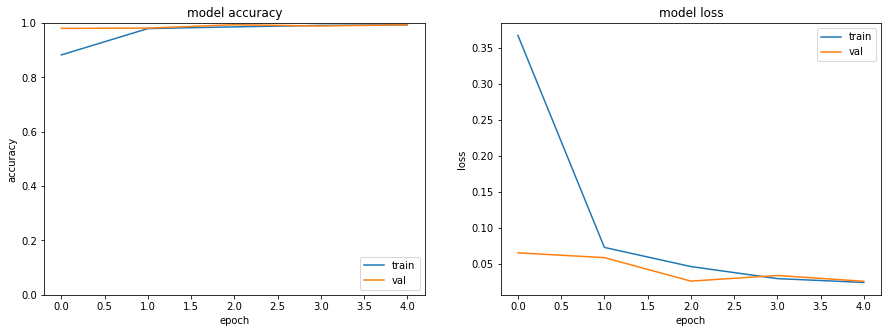

In [114]:
# Plot training history
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

# Plot training accuracy history
axs[0].plot(history.history['accuracy'])
axs[0].plot(history.history['val_accuracy'])
axs[0].set_title('model accuracy')
axs[0].set_ylabel('accuracy')
axs[0].set_xlabel('epoch')
axs[0].set_ylim(0,1)
axs[0].legend(['train', 'val'], loc='lower right')

axs[1].plot(history.history['loss'])
axs[1].plot(history.history['val_loss'])
axs[1].set_title('model loss')
axs[1].set_ylabel('loss')
axs[1].set_xlabel('epoch')
axs[1].legend(['train', 'val'], loc='upper right')

fig.show()

In [115]:
test_loss, test_accuracy = model.evaluate(X_test_std, y_test)

print(f'Test loss: {test_loss}')
print(f'Test accuracy: {test_accuracy}')

188/188 [==============================] - 8s 42ms/step - loss: 0.0321 - accuracy: 0.9910
Test loss: 0.03214897960424423
Test accuracy: 0.9909999966621399


In [116]:
y_pred_proba = model.predict(X_test_std)

y_pred_test = np.array([np.argmax(y) for y in y_pred_proba])
y_pred_test

array([2, 2, 1, ..., 0, 6, 8], dtype=int64)

In [117]:
y_true_test = np.array([np.argmax(y) for y in y_test])
y_true_test

array([2, 2, 1, ..., 0, 6, 8], dtype=int64)

In [118]:
# Classification Report
print(classification_report(y_true_test, y_pred_test))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99       600
           1       0.99      0.99      0.99       600
           2       0.99      1.00      1.00       600
           3       0.98      0.99      0.99       600
           4       0.99      1.00      0.99       600
           5       1.00      0.98      0.99       600
           6       0.99      0.99      0.99       600
           7       0.99      0.99      0.99       600
           8       0.99      0.99      0.99       600
           9       0.99      0.99      0.99       600

    accuracy                           0.99      6000
   macro avg       0.99      0.99      0.99      6000
weighted avg       0.99      0.99      0.99      6000



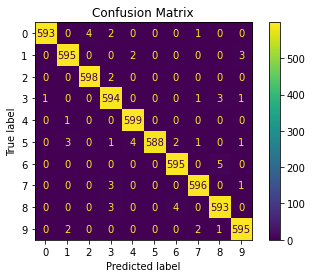

In [119]:
# Confusion matrix
ConfusionMatrixDisplay.from_predictions(y_true_test, y_pred_test)
plt.title('Confusion Matrix')
plt.show()

In [120]:
# Test on real data

# Load data
test_path = Path('testdata/Test_7_01_short.wav')

signal, sr = librosa.load(test_path, sr=None) # sr=None; load file with original sampling rate
sr = librosa.get_samplerate(test_path)
print('Sampling rate: ', sr)
duration = librosa.get_duration(signal, sr=sr)
print('Duration: ', duration)

Sampling rate:  48000
Duration:  0.9771041666666667


In [121]:
# Preprocess
signal, sr = librosa.load(test_path, sr=8000) # Default sr
        
# Padding signal
n_zeros = sr - len(signal)
n_zeros_front = int(n_zeros*.5)
n_zeros_back = n_zeros - n_zeros_front
signal_padded = np.pad(signal, (n_zeros_front, n_zeros_back))

# Extract mel spectrogram and convert to db scale
mel = librosa.feature.melspectrogram(signal_padded, sr=sr, n_fft=512, hop_length=35)
mel_db = librosa.power_to_db(mel)
mel_db = mel_db.reshape(1, mel_db.shape[0], mel_db.shape[1])

mel_db.shape

(1, 128, 229)

In [122]:
# Scaling
X_new = mel_db.reshape(1, n_rows * n_cols)
X_new_std = scaler.transform(X_new)
X_new_std = X_new_std.reshape(1, n_rows, n_cols, 1) # Reshape to 4D - needed for CCN

In [123]:
# Test
y_pred_new = model.predict(X_new_std)
np.argmax(y_pred_new)

7

### 1.6. MFCC model

In [75]:
# Load preprocessed data
preprocessed_data_df = pd.read_pickle('preprocessed_data_audiomnist.pkl')
preprocessed_data_df.head()

,speaker,digit,repetition,file,signal_padded,stft_db,mel_db,mfcc
0,01,0,0,0_01_0.wav,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[[-80.0, -80.0, -80.0, -80.0, -80.0, -80.0, -...","[[[-92.53915, -92.53915, -92.53915, -92.53915,...","[[[-1046.9609, -1046.9609, -1046.9609, -1046.9..."
1,01,0,1,0_01_1.wav,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[[-80.0, -80.0, -80.0, -80.0, -80.0, -80.0, -...","[[[-97.5652, -97.5652, -97.5652, -97.5652, -97...","[[[-1103.8242, -1103.8242, -1103.8242, -1103.8..."
2,01,0,10,0_01_10.wav,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[[-80.0, -80.0, -80.0, -80.0, -80.0, -80.0, -...","[[[-88.62083, -88.62083, -88.62083, -88.62083,...","[[[-1002.6302, -1002.6302, -1002.6302, -1002.6..."
3,01,0,11,0_01_11.wav,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[[-80.0, -80.0, -80.0, -80.0, -80.0, -80.0, -...","[[[-90.27966, -90.27966, -90.27966, -90.27966,...","[[[-1021.39777, -1021.39777, -1021.39777, -102..."
4,01,0,12,0_01_12.wav,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[[-80.0, -80.0, -80.0, -80.0, -80.0, -80.0, -...","[[[-93.71318, -93.71318, -93.71318, -93.71318,...","[[[-1060.2435, -1060.2435, -1060.2435, -1060.2..."


In [30]:
# MFCC feature
X = preprocessed_data_df['mfcc'].values
X = np.concatenate(X, axis=0)
X.shape

(30000, 14, 229)

In [31]:
n_recs = X.shape[0]
n_rows = X.shape[1]
n_cols = X.shape[2]

In [32]:
X = X.reshape(n_recs, n_rows*n_cols) # Flatten for StandardScaling
X.shape

(30000, 3206)

In [33]:
# Target variable
y = preprocessed_data_df['digit'].values

# To categorical - for softmax multiclass in keras
y = to_categorical(y, num_classes=10)
y.shape

(30000, 10)

In [34]:
# Filenames
files = preprocessed_data_df['file'].values
files.shape

(30000,)

In [35]:
# Train/test split with stratify on y (we want all digits being evenly represented in train and test)
X_train, X_test, y_train, y_test, files_train, files_test = train_test_split(X, y, files, test_size=0.2, stratify=y)
print('X_train: ', X_train.shape)
print('y_train: ', y_train.shape)
print('files_train: ', files_train.shape)
print('X_test: ', X_test.shape)
print('y_test: ', y_test.shape)
print('files_test: ', files_test.shape)

X_train:  (24000, 3206)
y_train:  (24000, 10)
files_train:  (24000,)
X_test:  (6000, 3206)
y_test:  (6000, 10)
files_test:  (6000,)


In [36]:
# Fit StandardScaler on training data
scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

In [37]:
X_train_std = X_train_std.reshape(X_train.shape[0], n_rows, n_cols, 1) # Reshape to 4D - needed for CCN
X_test_std = X_test_std.reshape(X_test.shape[0], n_rows, n_cols, 1)

X_train_std.shape, X_test_std.shape

((24000, 14, 229, 1), (6000, 14, 229, 1))

In [38]:
# Build simple CNN
model = Sequential([
    Conv2D(filters=32, kernel_size=10, strides=2, padding='same', activation='relu', input_shape=(n_rows, n_cols, 1)),
    MaxPool2D(pool_size=2, strides=2, padding='same'),
    Conv2D(filters=16, kernel_size=5, strides=2, padding='same', activation='relu'),
    MaxPool2D(pool_size=2, strides=2, padding='same'),
    Flatten(),
    #Dropout(0.5),
    Dense(units=30, activation='relu'),
    Dense(units=10, activation='softmax')
])

model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_2 (Conv2D)            (None, 7, 115, 32)        3232      
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 4, 58, 32)         0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 2, 29, 16)         12816     
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 1, 15, 16)         0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 240)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 30)                7230      
_________________________________________________________________
dense_3 (Dense)              (None, 10)               

In [39]:
# Model checkpoint to save best model
checkpoint_path = 'models/best_model_mfcc'
checkpoint = ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')

In [40]:
# Compile the model with adam optimizer and default settings
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [41]:
# Fit
history = model.fit(X_train_std, y_train, epochs=5, validation_split=0.2, batch_size=128, callbacks=[checkpoint])

Epoch 1/5
150/150 [==============================] - 9s 57ms/step - loss: 1.2966 - accuracy: 0.5486 - val_loss: 0.1385 - val_accuracy: 0.9592

Epoch 00001: val_accuracy improved from -inf to 0.95917, saving model to models\best_model_mfcc
INFO:tensorflow:Assets written to: models\best_model_mfcc\assets
Epoch 2/5
150/150 [==============================] - 9s 60ms/step - loss: 0.1002 - accuracy: 0.9699 - val_loss: 0.0780 - val_accuracy: 0.9808

Epoch 00002: val_accuracy improved from 0.95917 to 0.98083, saving model to models\best_model_mfcc
INFO:tensorflow:Assets written to: models\best_model_mfcc\assets
Epoch 3/5
150/150 [==============================] - 9s 62ms/step - loss: 0.0588 - accuracy: 0.9830 - val_loss: 0.0485 - val_accuracy: 0.9858

Epoch 00003: val_accuracy improved from 0.98083 to 0.98583, saving model to models\best_model_mfcc
INFO:tensorflow:Assets written to: models\best_model_mfcc\assets
Epoch 4/5
150/150 [==============================] - 10s 64ms/step - loss: 0.0331 

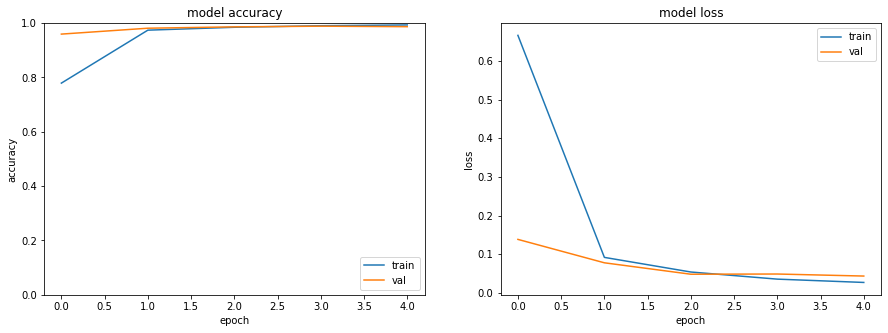

In [42]:
# Plot training history
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

# Plot training accuracy history
axs[0].plot(history.history['accuracy'])
axs[0].plot(history.history['val_accuracy'])
axs[0].set_title('model accuracy')
axs[0].set_ylabel('accuracy')
axs[0].set_xlabel('epoch')
axs[0].set_ylim(0,1)
axs[0].legend(['train', 'val'], loc='lower right')

axs[1].plot(history.history['loss'])
axs[1].plot(history.history['val_loss'])
axs[1].set_title('model loss')
axs[1].set_ylabel('loss')
axs[1].set_xlabel('epoch')
axs[1].legend(['train', 'val'], loc='upper right')

fig.show()

In [43]:
test_loss, test_accuracy = model.evaluate(X_test_std, y_test)

print(f'Test loss: {test_loss}')
print(f'Test accuracy: {test_accuracy}')

188/188 [==============================] - 1s 4ms/step - loss: 0.0488 - accuracy: 0.9863
Test loss: 0.04877069965004921
Test accuracy: 0.9863333106040955


In [44]:
y_pred_proba = model.predict(X_test_std)

y_pred_test = np.array([np.argmax(y) for y in y_pred_proba])
y_pred_test

array([0, 0, 8, ..., 0, 1, 5], dtype=int64)

In [45]:
y_true_test = np.array([np.argmax(y) for y in y_test])
y_true_test

array([0, 0, 8, ..., 0, 1, 5], dtype=int64)

In [46]:
# Classification Report
print(classification_report(y_true_test, y_pred_test))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99       600
           1       0.99      0.98      0.99       600
           2       0.99      0.98      0.99       600
           3       0.99      0.95      0.97       600
           4       0.98      1.00      0.99       600
           5       0.99      0.99      0.99       600
           6       0.99      0.99      0.99       600
           7       0.98      0.99      0.99       600
           8       0.96      0.99      0.97       600
           9       0.99      0.98      0.99       600

    accuracy                           0.99      6000
   macro avg       0.99      0.99      0.99      6000
weighted avg       0.99      0.99      0.99      6000



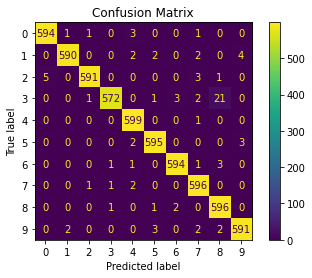

In [47]:
# Confusion matrix
ConfusionMatrixDisplay.from_predictions(y_true_test, y_pred_test)
plt.title('Confusion Matrix')
plt.show()

In [48]:
# Test on real data

# Load data
test_path = Path('testdata/Test_7_01_short.wav')

signal, sr = librosa.load(test_path, sr=None) # sr=None; load file with original sampling rate
sr = librosa.get_samplerate(test_path)
print('Sampling rate: ', sr)
duration = librosa.get_duration(signal, sr=sr)
print('Duration: ', duration)

Sampling rate:  48000
Duration:  0.9771041666666667


In [49]:
# Preprocess
signal, sr = librosa.load(test_path, sr=8000) # Default sr
        
# Padding signal
n_zeros = sr - len(signal)
n_zeros_front = int(n_zeros*.5)
n_zeros_back = n_zeros - n_zeros_front
signal_padded = np.pad(signal, (n_zeros_front, n_zeros_back))

# Extract MFCC
mfcc = librosa.feature.mfcc(signal_padded, sr=sr, n_fft=512, n_mfcc=14, hop_length=35)
mfcc = mfcc.reshape(1, mfcc.shape[0], mfcc.shape[1])
mfcc.shape

(1, 14, 229)

In [50]:
# Scaling
X_new = mfcc.reshape(1, n_rows * n_cols)
X_new_std = scaler.transform(X_new)
X_new_std = X_new_std.reshape(1, n_rows, n_cols, 1) # Reshape to 4D - needed for CCN

In [51]:
# Test
y_pred_new = model.predict(X_new_std)
np.argmax(y_pred_new)

7

## 2. Environmental Sound Classification (ESC-10)
The second part of this notebook builds classification models for the ESC-10 dataset. ESC-10 is a subset of the ESC-50 dataset which was introduced by Piczak (2015).

Paper: https://www.karolpiczak.com/papers/Piczak2015-ESC-Dataset.pdf   
Original Dataset: https://github.com/karolpiczak/ESC-50 or https://dataverse.harvard.edu/dataset.xhtml?persistentId=doi:10.7910/DVN/YDEPUT   
Leaderboard for ESC-50: https://github.com/karolpiczak/ESC-50 and https://paperswithcode.com/sota/audio-classification-on-esc-50   
Metrics for ESC-10 models: https://www.researchgate.net/publication/344519283_Automatic_Environmental_Sound_Recognition_AESR_Using_Convolutional_Neural_Network

Brief description of data (from README):  
The ESC-50 dataset is a labeled collection of 2000 environmental audio recordings suitable for benchmarking methods of environmental sound classification. The dataset consists of 5-second-long recordings organized into 50 semantical classes (with 40 examples per class) loosely arranged into 5 major categories. For shorter recordings than 5-second-long padding with silence was performed. The extracted samples were reconverted to a unified format (44.1 kHz, single channel, compression at 192 kbit/s). 

Filename convention is '{fold}-{src_file}-{take}-{target}.wav'  

fold: Prearranged folder number to perform 5-fold cross-validation (if needed)   
src_file: Original source file id for 5 sec clip   
take: Additional recording from same source file   
target: Class to which the recording belongs

### 2.1. EDA

In [41]:
source_path = Path('../ESC-50-master/audio')
metadata_path = os.path.join('../ESC-50-master/meta/esc50.csv')

In [42]:
metadata_df = pd.read_csv(metadata_path)
metadata_df.head()

,filename,fold,target,category,esc10,src_file,take
0,1-100032-A-0.wav,1,0,dog,True,100032,A
1,1-100038-A-14.wav,1,14,chirping_birds,False,100038,A
2,1-100210-A-36.wav,1,36,vacuum_cleaner,False,100210,A
3,1-100210-B-36.wav,1,36,vacuum_cleaner,False,100210,B
4,1-101296-A-19.wav,1,19,thunderstorm,False,101296,A


In [56]:
# Number of records
metadata_df['filename'].count()

2000

In [57]:
# Distribution per category
metadata_df.groupby('category')['filename'].count()

category
airplane            40
breathing           40
brushing_teeth      40
can_opening         40
car_horn            40
cat                 40
chainsaw            40
chirping_birds      40
church_bells        40
clapping            40
clock_alarm         40
clock_tick          40
coughing            40
cow                 40
crackling_fire      40
crickets            40
crow                40
crying_baby         40
dog                 40
door_wood_creaks    40
door_wood_knock     40
drinking_sipping    40
engine              40
fireworks           40
footsteps           40
frog                40
glass_breaking      40
hand_saw            40
helicopter          40
hen                 40
insects             40
keyboard_typing     40
laughing            40
mouse_click         40
pig                 40
pouring_water       40
rain                40
rooster             40
sea_waves           40
sheep               40
siren               40
sneezing            40
snoring             40
th

In [58]:
# ESC-10 categories
metadata_df[metadata_df['esc10']].groupby(['category', 'target'])['filename'].count().reset_index().sort_values(by='target')

,category,target,filename
4,dog,0,40
7,rooster,1,40
6,rain,10,40
8,sea_waves,11,40
2,crackling_fire,12,40
3,crying_baby,20,40
9,sneezing,21,40
1,clock_tick,38,40
5,helicopter,40,40
0,chainsaw,41,40


In [59]:
example_path = os.path.join(source_path, '1-21934-A-38.wav')

signal, sr = librosa.load(example_path, sr=None) # sr=None; load file with original sampling rate
sr = librosa.get_samplerate(example_path)
print('Sampling rate: ', sr)
duration = librosa.get_duration(signal, sr=sr)
print('Duration: ', duration)

Sampling rate:  44100
Duration:  5.0


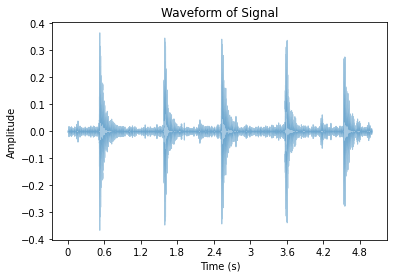

In [60]:
librosa.display.waveshow(signal, sr=sr, alpha=0.4)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Waveform of Signal')
plt.show()

In [61]:
Audio(signal, rate=sr)

In [206]:
# Check signal length distribution over all files
raw_data = []

for file in tqdm(os.listdir(source_path)):
          
    file_path = os.path.join(source_path, file)
    signal, sr = librosa.load(file_path, sr=None) # None = Use original SR

    raw_data.append({
        'file': file,
        'signal': signal,
        'signal_length': len(signal),
        'org_sampling_rate': sr
    })
        
        
raw_data_df = pd.DataFrame(raw_data).sort_values(by=['file'])
raw_data_df.describe() # Verify that signal_length and sampling rate are the same across all files, as stated by original dataset paper

100%|██████████| 2000/2000 [00:08<00:00, 228.43it/s]


,signal_length,org_sampling_rate
count,2000.0,2000.0
mean,220500.0,44100.0
std,0.0,0.0
min,220500.0,44100.0
25%,220500.0,44100.0
50%,220500.0,44100.0
75%,220500.0,44100.0
max,220500.0,44100.0


In [43]:
# Get metadata and files for esc10 data
metadata_esc10_df = metadata_df[metadata_df['esc10']]
esc10_files = metadata_esc10_df['filename'].values
esc10_files[:10]

array(['1-100032-A-0.wav', '1-110389-A-0.wav', '1-116765-A-41.wav',
       '1-17150-A-12.wav', '1-172649-A-40.wav', '1-172649-B-40.wav',
       '1-172649-C-40.wav', '1-172649-D-40.wav', '1-172649-E-40.wav',
       '1-172649-F-40.wav'], dtype=object)

In [44]:
# Get first record for each category
example_files = metadata_esc10_df.groupby('category').first().reset_index()[['category', 'filename']].values
example_files[:10]

array([['chainsaw', '1-116765-A-41.wav'],
       ['clock_tick', '1-21934-A-38.wav'],
       ['crackling_fire', '1-17150-A-12.wav'],
       ['crying_baby', '1-187207-A-20.wav'],
       ['dog', '1-100032-A-0.wav'],
       ['helicopter', '1-172649-A-40.wav'],
       ['rain', '1-17367-A-10.wav'],
       ['rooster', '1-26806-A-1.wav'],
       ['sea_waves', '1-28135-A-11.wav'],
       ['sneezing', '1-26143-A-21.wav']], dtype=object)

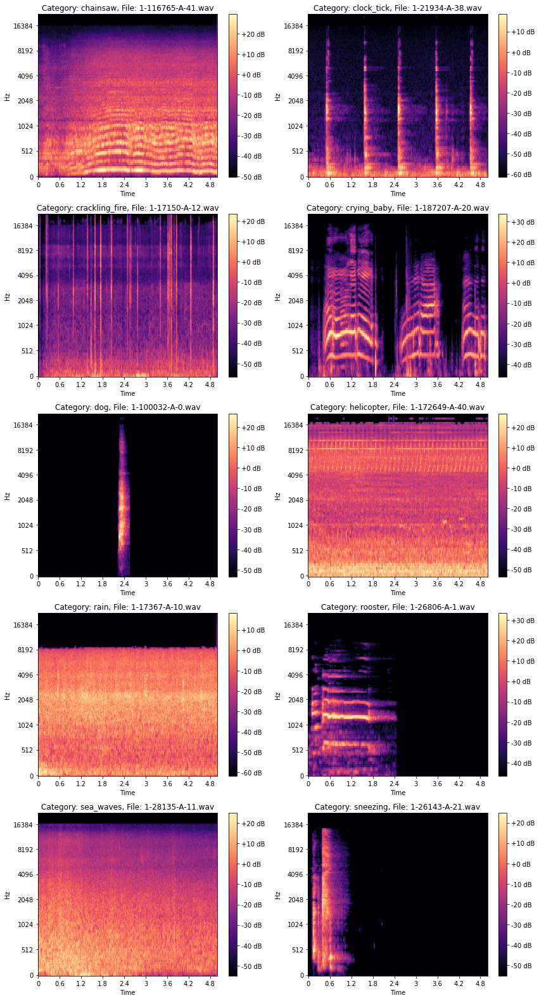

In [49]:
# Create Mel spectrogram plots for one example per category
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(12, 22))

# loop through digits and axes
for example_file, ax in zip(example_files, axs.ravel()):
    
    # Load file
    example_path = os.path.join(source_path, example_file[1])
    signal, sr = librosa.load(example_path, sr=None)

    # Create Mel spectrogram
    mel = librosa.feature.melspectrogram(signal, sr=sr, n_fft=2048, hop_length=512)
    mel_db = librosa.power_to_db(mel)
    
    # Display spectrogram
    img = librosa.display.specshow(mel_db, x_axis='time', y_axis='mel', ax=ax, sr=sr, hop_length=512, cmap='magma')
    
    # Format plot
    ax.set_title(f'Category: {example_file[0]}, File: {example_file[1]}')
    fig.colorbar(img, ax=ax, format='%+2.0f dB')

fig.tight_layout()
plt.show()

In [20]:
clock_files = metadata_esc10_df[metadata_df['category']=='clock_tick'][['category', 'filename']].values
clock_files[:10]

array([['clock_tick', '1-21934-A-38.wav'],
       ['clock_tick', '1-21935-A-38.wav'],
       ['clock_tick', '1-35687-A-38.wav'],
       ['clock_tick', '1-42139-A-38.wav'],
       ['clock_tick', '1-48413-A-38.wav'],
       ['clock_tick', '1-57163-A-38.wav'],
       ['clock_tick', '1-62849-A-38.wav'],
       ['clock_tick', '1-62850-A-38.wav'],
       ['clock_tick', '2-119748-A-38.wav'],
       ['clock_tick', '2-127108-A-38.wav']], dtype=object)

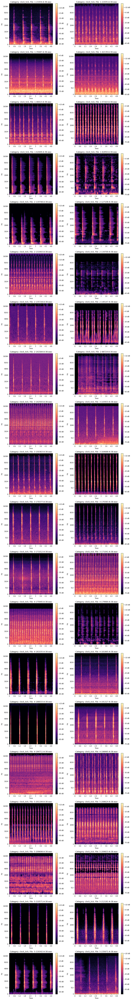

In [21]:
# Create Mel spectrogram plots for all waterdrops (40 samples)
fig, axs = plt.subplots(nrows=20, ncols=2, figsize=(12, 90))

# loop through digits and axes
for example_file, ax in zip(clock_files, axs.ravel()):
    
    # Load file
    example_path = os.path.join(source_path, example_file[1])
    signal, sr = librosa.load(example_path, sr=None)

    # Create Mel spectrogram
    mel = librosa.feature.melspectrogram(signal, sr=sr, n_fft=2048, hop_length=512)
    mel_db = librosa.power_to_db(mel)
    
    # Display spectrogram
    img = librosa.display.specshow(mel_db, x_axis='time', y_axis='mel', ax=ax, sr=sr, hop_length=512, cmap='magma')
    
    # Format plot
    ax.set_title(f'Category: {example_file[0]}, File: {example_file[1]}')
    fig.colorbar(img, ax=ax, format='%+2.0f dB')

fig.tight_layout()
plt.show()

In [25]:
# Spectrogram for all dogs
dog_files = metadata_df[metadata_df['category']=='dog'][['category', 'filename']].values
dog_files[:10]

array([['dog', '1-100032-A-0.wav'],
       ['dog', '1-110389-A-0.wav'],
       ['dog', '1-30226-A-0.wav'],
       ['dog', '1-30344-A-0.wav'],
       ['dog', '1-32318-A-0.wav'],
       ['dog', '1-59513-A-0.wav'],
       ['dog', '1-85362-A-0.wav'],
       ['dog', '1-97392-A-0.wav'],
       ['dog', '2-114280-A-0.wav'],
       ['dog', '2-114587-A-0.wav']], dtype=object)

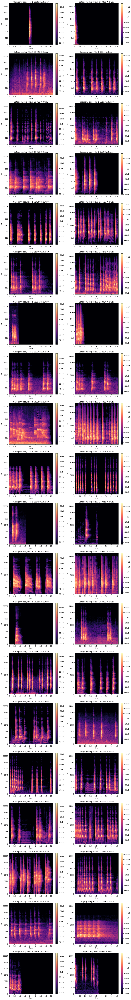

In [26]:
# Example all dogs

# Create Mel spectrogram plots for all dogs (40 samples)
fig, axs = plt.subplots(nrows=20, ncols=2, figsize=(12, 90))

# loop through digits and axes
for example_file, ax in zip(dog_files, axs.ravel()):
    
    # Load file
    example_path = os.path.join(source_path, example_file[1])
    signal, sr = librosa.load(example_path, sr=None)

    # Create Mel spectrogram
    mel = librosa.feature.melspectrogram(signal, sr=sr, n_fft=2048, hop_length=512)
    mel_db = librosa.power_to_db(mel)
    
    # Display spectrogram
    img = librosa.display.specshow(mel_db, x_axis='time', y_axis='mel', ax=ax, sr=sr, hop_length=512, cmap='magma')
    
    # Format plot
    ax.set_title(f'Category: {example_file[0]}, File: {example_file[1]}')
    fig.colorbar(img, ax=ax, format='%+2.0f dB')

fig.tight_layout()
plt.show()

In [62]:
# Example dogs
example_path = os.path.join(source_path, '1-59513-A-0.wav')
signal, sr = librosa.load(example_path, sr=None)

Audio(signal, rate=sr)

### 2.2. Mel spectrogram model using CNN without data augmentation
Parameter grid search with on the fly mel spectrogram generation (i.e. part of training process)

In [36]:
n_fft = 2048 # Default of librosa
hop_length = 512 # Default of librosa, i.e. n_fft / 4
n_mels = 128 # Default of librosa
sr_all = 44100 # Original SR
num_classes = 10 # For ESC10

# Remap original labels for ESC10 data
label_map = {
    0: 0,  # dog
    1: 1,  # rooster
    10: 2, # rain
    11: 3, # sea_waves
    12: 4, # crackling_fire
    20: 5, # crying_baby
    21: 6, # sneezing
    38: 7, # clock_tick
    40: 8, # helicopter
    41: 9  # chainsaw
}

label_names = [
    'dog',
    'rooster',
    'rain',
    'sea_waves',
    'crackling_fire',
    'crying_baby',
    'sneezing',
    'clock_tick',
    'helicopter',
    'chainsaw'
]

In [178]:
# Load file
example_path = os.path.join(source_path, '1-59513-A-0.wav')
signal, sr = librosa.load(example_path, sr=sr_all)

# Create Mel spectrogram
mel = librosa.feature.melspectrogram(signal, sr=sr, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels)
mel_db = librosa.power_to_db(mel)

print(mel_db.shape)

(128, 431)


In [56]:
# Create spectrograms for all ESC-10 files
preprocessed_data = []

for file in tqdm(esc10_files):
    
    # Load file
    file_path = os.path.join(source_path, file)
    signal, sr = librosa.load(file_path, sr=sr_all)

    # Create Mel Spectrogram and convert to db scale
    mel = librosa.feature.melspectrogram(signal, sr=sr, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels)
    mel_db = librosa.power_to_db(mel)
    mel_db = mel_db.reshape(1, mel_db.shape[0], mel_db.shape[1])
    
    # Extract class label from filename
    label_org = int(file.split('-')[-1].split('.')[0])
    
    # Get new label from label map
    label = label_map[label_org]

    preprocessed_data.append({
        'file': file,
        'label': label,
        'signal': signal,
        'mel_db': mel_db
    })

preprocessed_data_df = pd.DataFrame(preprocessed_data)
preprocessed_data_df.head()

100%|██████████| 400/400 [00:05<00:00, 66.98it/s]


,file,label,signal,mel_db
0,1-100032-A-0.wav,0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[[-53.3022, -53.3022, -53.3022, -53.3022, -53..."
1,1-110389-A-0.wav,0,"[-0.0025634766, -0.0011291504, 0.00012207031, ...","[[[-10.220087, 0.27027115, 2.8102493, 0.202547..."
2,1-116765-A-41.wav,9,"[-0.01260376, -0.015045166, -0.0154418945, -0....","[[[-22.876083, -27.223824, -31.730383, -29.084..."
3,1-17150-A-12.wav,4,"[0.0014343262, 0.0017700195, 0.0015563965, 0.0...","[[[-19.44487, -17.593687, -19.15633, -17.98147..."
4,1-172649-A-40.wav,8,"[0.11935425, 0.1296997, 0.14428711, 0.20455933...","[[[9.375204, 14.343754, 10.94474, 10.635153, 1..."


In [57]:
# Save data
preprocessed_data_df.to_pickle('preprocessed_data_esc10.pkl')

In [179]:
preprocessed_data_df = pd.read_pickle('preprocessed_data_esc10.pkl')

In [180]:
# Distinct labels
np.sort(preprocessed_data_df['label'].unique())

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9], dtype=int64)

In [181]:
# Spectrogram feature
X = preprocessed_data_df['mel_db'].values
X = np.concatenate(X, axis=0)
print(X.shape)

n_recs = X.shape[0]
n_rows = X.shape[1]
n_cols = X.shape[2]

X = X.reshape(n_recs, n_rows*n_cols) # Flatten for StandardScaling
print(X.shape)

# Target variable
y = preprocessed_data_df['label'].values

# To categorical - for softmax multiclass in keras
y = to_categorical(y, num_classes=num_classes)
print(y.shape)

# Filenames
files = preprocessed_data_df['file'].values
print(files.shape)

# Train/test split with stratify on y (we want all digits being evenly represented in train and test)
X_train, X_test, y_train, y_test, files_train, files_test = train_test_split(X, y, files, test_size=0.2, stratify=y, random_state=42)

# Split train set from above in train and valid set, so we have train, valid and test set
X_train, X_valid, y_train, y_valid, files_train, files_valid = train_test_split(X_train, y_train, files_train, test_size=0.2, stratify=y_train, random_state=42)
print('X_train: ', X_train.shape)
print('y_train: ', y_train.shape)
print('files_train: ', files_train.shape)
print('X_valid: ', X_valid.shape)
print('y_valid: ', y_valid.shape)
print('files_valid: ', files_valid.shape)
print('X_test: ', X_test.shape)
print('y_test: ', y_test.shape)
print('files_test: ', files_test.shape)

# Fit StandardScaler on training data
scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_valid_std = scaler.transform(X_valid)
X_test_std = scaler.transform(X_test)

X_train_std = X_train_std.reshape(X_train.shape[0], n_rows, n_cols, 1) # Reshape to 4D - needed for CCN
X_valid_std = X_valid_std.reshape(X_valid.shape[0], n_rows, n_cols, 1)
X_test_std = X_test_std.reshape(X_test.shape[0], n_rows, n_cols, 1)

print(X_train_std.shape, X_valid_std.shape, X_test_std.shape)

(400, 128, 431)
(400, 55168)
(400, 10)
(400,)
X_train:  (256, 55168)
y_train:  (256, 10)
files_train:  (256,)
X_valid:  (64, 55168)
y_valid:  (64, 10)
files_valid:  (64,)
X_test:  (80, 55168)
y_test:  (80, 10)
files_test:  (80,)
(256, 128, 431, 1) (64, 128, 431, 1) (80, 128, 431, 1)


In [182]:
# Build and train CNN
model = Sequential([
    Conv2D(filters=64, kernel_size=10, strides=2, padding='same', activation='relu', input_shape=(n_rows, n_cols, 1)),
    MaxPool2D(pool_size=2, strides=2, padding='same'),
    Conv2D(filters=32, kernel_size=10, strides=2, padding='same', activation='relu'),
    MaxPool2D(pool_size=2, strides=2, padding='same'),
    Conv2D(filters=32, kernel_size=5, strides=2, padding='same', activation='relu'),
    MaxPool2D(pool_size=2, strides=2, padding='same'),
    Flatten(),
    Dropout(0.5),
    Dense(units=150, activation='relu'),
    Dense(units=num_classes, activation='softmax')
])

model.summary()

# Model checkpoint to save best model
checkpoint_path = 'models/best_model_esc10_mel'
checkpoint = ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')

early_stopping = EarlyStopping(monitor='val_loss', patience=5)

# Compile the model with adam optimizer and default settings
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Fit
history = model.fit(X_train_std, y_train, epochs=20, validation_data=(X_valid_std, y_valid), batch_size=64, callbacks=[checkpoint])

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 64, 216, 64)       6464      
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 32, 108, 64)       0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 16, 54, 32)        204832    
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 8, 27, 32)         0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 4, 14, 32)         25632     
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 2, 7, 32)          0         
_________________________________________________________________
flatten_2 (Flatten)          (None, 448)              

INFO:tensorflow:Assets written to: models\best_model_esc10_mel\assets


Epoch 2/20
4/4 [==============================] - 5s 1s/step - loss: 2.1050 - accuracy: 0.2703 - val_loss: 1.7907 - val_accuracy: 0.2656

Epoch 00002: val_accuracy did not improve from 0.29688
Epoch 3/20
4/4 [==============================] - 5s 1s/step - loss: 1.8801 - accuracy: 0.3099 - val_loss: 1.5603 - val_accuracy: 0.5625

Epoch 00003: val_accuracy improved from 0.29688 to 0.56250, saving model to models\best_model_esc10_mel
INFO:tensorflow:Assets written to: models\best_model_esc10_mel\assets


INFO:tensorflow:Assets written to: models\best_model_esc10_mel\assets


Epoch 4/20
4/4 [==============================] - 5s 1s/step - loss: 1.6746 - accuracy: 0.3750 - val_loss: 1.3852 - val_accuracy: 0.5312

Epoch 00004: val_accuracy did not improve from 0.56250
Epoch 5/20
4/4 [==============================] - 5s 1s/step - loss: 1.5879 - accuracy: 0.4052 - val_loss: 1.2118 - val_accuracy: 0.5000

Epoch 00005: val_accuracy did not improve from 0.56250
Epoch 6/20
4/4 [==============================] - 5s 1s/step - loss: 1.3191 - accuracy: 0.5135 - val_loss: 1.0898 - val_accuracy: 0.5469

Epoch 00006: val_accuracy did not improve from 0.56250
Epoch 7/20
4/4 [==============================] - 5s 1s/step - loss: 1.2582 - accuracy: 0.5740 - val_loss: 0.9915 - val_accuracy: 0.6719

Epoch 00007: val_accuracy improved from 0.56250 to 0.67188, saving model to models\best_model_esc10_mel
INFO:tensorflow:Assets written to: models\best_model_esc10_mel\assets


INFO:tensorflow:Assets written to: models\best_model_esc10_mel\assets


Epoch 8/20
4/4 [==============================] - 5s 1s/step - loss: 1.0834 - accuracy: 0.5667 - val_loss: 1.0165 - val_accuracy: 0.6406

Epoch 00008: val_accuracy did not improve from 0.67188
Epoch 9/20
4/4 [==============================] - 6s 2s/step - loss: 0.9386 - accuracy: 0.6911 - val_loss: 1.0698 - val_accuracy: 0.5938

Epoch 00009: val_accuracy did not improve from 0.67188
Epoch 10/20
4/4 [==============================] - 6s 2s/step - loss: 1.0169 - accuracy: 0.5958 - val_loss: 0.8842 - val_accuracy: 0.6250

Epoch 00010: val_accuracy did not improve from 0.67188
Epoch 11/20
4/4 [==============================] - 6s 2s/step - loss: 0.8699 - accuracy: 0.6786 - val_loss: 0.7926 - val_accuracy: 0.7344

Epoch 00011: val_accuracy improved from 0.67188 to 0.73438, saving model to models\best_model_esc10_mel
INFO:tensorflow:Assets written to: models\best_model_esc10_mel\assets


INFO:tensorflow:Assets written to: models\best_model_esc10_mel\assets


Epoch 12/20
4/4 [==============================] - 6s 2s/step - loss: 0.7613 - accuracy: 0.7224 - val_loss: 0.8939 - val_accuracy: 0.7656

Epoch 00012: val_accuracy improved from 0.73438 to 0.76562, saving model to models\best_model_esc10_mel
INFO:tensorflow:Assets written to: models\best_model_esc10_mel\assets


INFO:tensorflow:Assets written to: models\best_model_esc10_mel\assets


Epoch 13/20
4/4 [==============================] - 6s 2s/step - loss: 0.8469 - accuracy: 0.6927 - val_loss: 0.7265 - val_accuracy: 0.7188

Epoch 00013: val_accuracy did not improve from 0.76562
Epoch 14/20
4/4 [==============================] - 7s 2s/step - loss: 0.6509 - accuracy: 0.7521 - val_loss: 0.7636 - val_accuracy: 0.7500

Epoch 00014: val_accuracy did not improve from 0.76562
Epoch 15/20
4/4 [==============================] - 7s 2s/step - loss: 0.5915 - accuracy: 0.7786 - val_loss: 0.7752 - val_accuracy: 0.7188

Epoch 00015: val_accuracy did not improve from 0.76562
Epoch 16/20
4/4 [==============================] - 7s 2s/step - loss: 0.7002 - accuracy: 0.7266 - val_loss: 0.8011 - val_accuracy: 0.7188

Epoch 00016: val_accuracy did not improve from 0.76562
Epoch 17/20
4/4 [==============================] - 7s 2s/step - loss: 0.5931 - accuracy: 0.7896 - val_loss: 0.6936 - val_accuracy: 0.7656

Epoch 00017: val_accuracy did not improve from 0.76562
Epoch 18/20
4/4 [=============

INFO:tensorflow:Assets written to: models\best_model_esc10_mel\assets


Epoch 20/20
4/4 [==============================] - 7s 2s/step - loss: 0.4693 - accuracy: 0.8193 - val_loss: 0.6584 - val_accuracy: 0.7969

Epoch 00020: val_accuracy did not improve from 0.81250


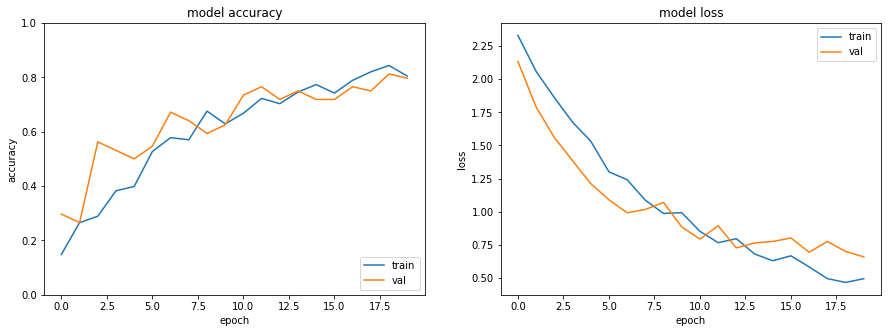

3/3 [==============================] - 1s 125ms/step - loss: 0.6438 - accuracy: 0.7625
Test loss: 0.6437910795211792
Test accuracy: 0.762499988079071
                precision    recall  f1-score   support

           dog       1.00      0.50      0.67         8
       rooster       1.00      1.00      1.00         8
          rain       0.40      0.50      0.44         8
     sea_waves       0.62      0.62      0.62         8
crackling_fire       1.00      0.75      0.86         8
   crying_baby       1.00      1.00      1.00         8
      sneezing       0.73      1.00      0.84         8
    clock_tick       0.64      0.88      0.74         8
    helicopter       0.83      0.62      0.71         8
      chainsaw       0.75      0.75      0.75         8

      accuracy                           0.76        80
     macro avg       0.80      0.76      0.76        80
  weighted avg       0.80      0.76      0.76        80



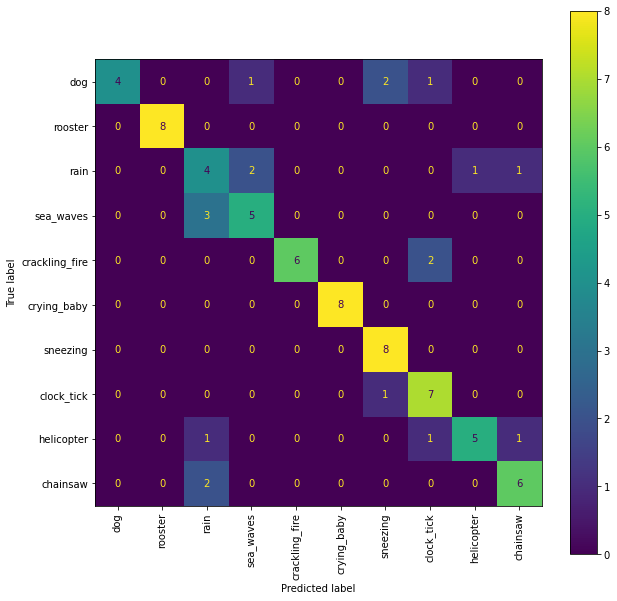

In [184]:
# Load best model
model = tf.keras.models.load_model(checkpoint_path)

# Plot training history
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

# Plot training accuracy history
axs[0].plot(history.history['accuracy'])
axs[0].plot(history.history['val_accuracy'])
axs[0].set_title('model accuracy')
axs[0].set_ylabel('accuracy')
axs[0].set_xlabel('epoch')
axs[0].set_ylim(0,1)
axs[0].legend(['train', 'val'], loc='lower right')

axs[1].plot(history.history['loss'])
axs[1].plot(history.history['val_loss'])
axs[1].set_title('model loss')
axs[1].set_ylabel('loss')
axs[1].set_xlabel('epoch')
axs[1].legend(['train', 'val'], loc='upper right')

plt.show()

test_loss, test_accuracy = model.evaluate(X_test_std, y_test)

print(f'Test loss: {test_loss}')
print(f'Test accuracy: {test_accuracy}')

y_pred_proba = model.predict(X_test_std)
y_pred_test = np.array([np.argmax(y) for y in y_pred_proba])
y_true_test = np.array([np.argmax(y) for y in y_test])

# Classification Report
print(classification_report(y_true_test, y_pred_test, target_names=label_names))

# Confusion matrix
fig, ax = plt.subplots(figsize=(10,10))
cmp = ConfusionMatrixDisplay.from_predictions(y_true_test, y_pred_test, display_labels=label_names, xticks_rotation='vertical', ax=ax)
plt.show()

### 2.3. Mel spectrogram model using CNN and data augmentation
Following data augmentation techniques are used:
- Noise (white noise, i.e. all frequencies are affected with same intensity)
- Time shifting (move to left/right and fill with silence)
- Time stretching (speed up or slow down)
    - Audiomentions makes zero-right-padding if result is less than before; if its larger, keep up to max and cut rest
- Pitch shifting (increase/decrease frequency)
- Random gain (increase amplitude/loudness)

Many more augmentation techniques available (e.g. mixing in a background noise), check out: https://github.com/iver56/audiomentations

Augmentation is performed offline (i.e. not part of the CNN learning) and only on training data set and not on test and validation set. All augmentation is performed on signal and not on spectrogram.

Augmentation technique is chosen randomly and for each category the training data amount is doubled

Audiomentation Library is used to perform all augmentations and build augmentation pipeline

In [86]:
files_train[:15]

array(['4-198965-A-38.wav', '5-221518-A-21.wav', '3-120644-A-12.wav',
       '2-118104-A-21.wav', '2-28314-B-12.wav', '4-164064-A-1.wav',
       '3-150979-A-40.wav', '2-96460-A-1.wav', '4-171519-A-21.wav',
       '3-142005-A-10.wav', '5-203739-A-10.wav', '5-170338-B-41.wav',
       '1-47273-A-21.wav', '1-40730-A-1.wav', '3-164688-A-38.wav'],
      dtype=object)

In [10]:
# Original example
example_path = os.path.join(source_path, '3-164688-A-38.wav') # clock tick
signal, sr = librosa.load(example_path, sr=None)

Audio(signal, rate=sr)

In [13]:
# Write stream to file
sf.write('aug_example/original.wav', signal, sr)

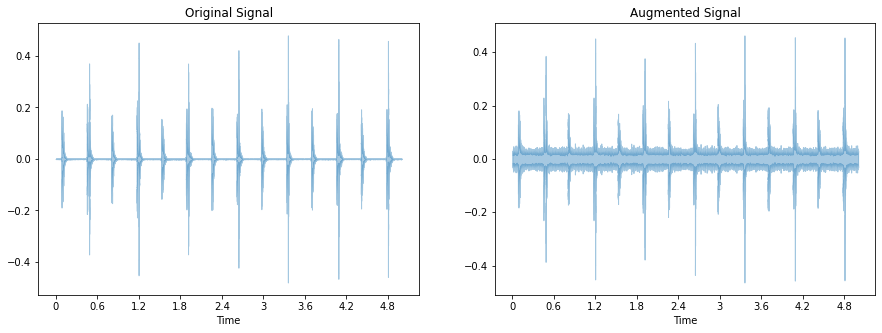

In [14]:
# Add Noise
augment = Compose([
    # p is the probability that the augmentation is used in the pipeline
    AddGaussianNoise(min_amplitude=0.01, max_amplitude=0.015, p=1.0)
])

# Augment/transform/perturb the audio data
augmented_signal = augment(samples=signal, sample_rate=sr)

# Display Waveform
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
librosa.display.waveshow(signal, sr=sr, alpha=0.4, ax=axs[0])
librosa.display.waveshow(augmented_signal, sr=sr, alpha=0.4, ax=axs[1])
axs[0].set_title('Original Signal')
axs[1].set_title('Augmented Signal')

Audio(augmented_signal, rate=sr)

In [15]:
# Write augmented stream to file
sf.write('aug_example/noise.wav', augmented_signal, sr)

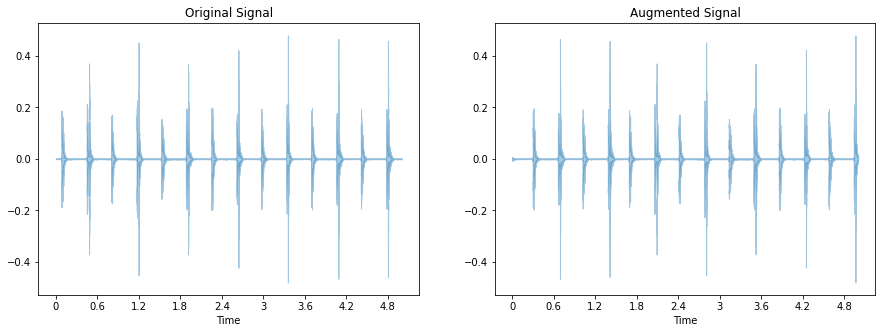

In [18]:
# Time shifting
augment = Compose([
    Shift(min_fraction=-1, max_fraction=1, p=1.0), # With default rollover = true, see: https://github.com/iver56/audiomentations/blob/master/audiomentations/augmentations/shift.py
])

# Augment/transform/perturb the audio data
augmented_signal = augment(samples=signal, sample_rate=sr)

# Display Waveform
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
librosa.display.waveshow(signal, sr=sr, alpha=0.4, ax=axs[0])
librosa.display.waveshow(augmented_signal, sr=sr, alpha=0.4, ax=axs[1])
axs[0].set_title('Original Signal')
axs[1].set_title('Augmented Signal')

Audio(augmented_signal, rate=sr)

In [19]:
# Write augmented stream to file
sf.write('aug_example/shift.wav', augmented_signal, sr)

Augmented Signal Length:  5.0
Original Signal Length:  5.0


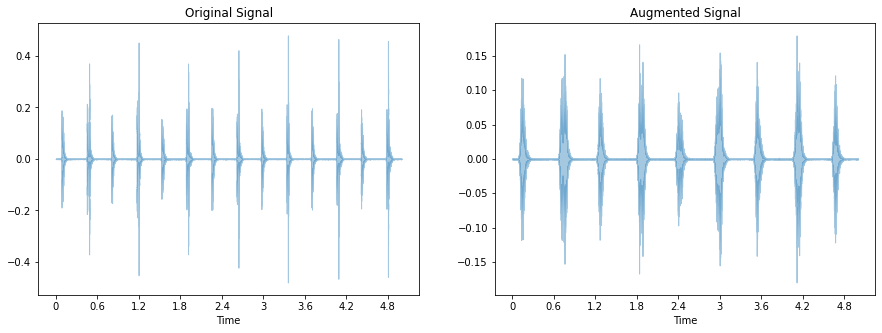

In [21]:
# Time stretching (speeding up or slowing down)
augment = Compose([
    # min_rate/max_rate, rate by how much signal is stretched (e.g. 0.5 is half the original speed)
    TimeStretch(min_rate=0.5, max_rate=1.5, p=1.0) 
])

# Augment/transform/perturb the audio data
augmented_signal = augment(samples=signal, sample_rate=sr)

# Display Waveform
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
librosa.display.waveshow(signal, sr=sr, alpha=0.4, ax=axs[0])
librosa.display.waveshow(augmented_signal, sr=sr, alpha=0.4, ax=axs[1])
axs[0].set_title('Original Signal')
axs[1].set_title('Augmented Signal')

# Signal after augmentation has still the same length, but is right-padded with silence
print('Augmented Signal Length: ', librosa.get_duration(augmented_signal, sr=sr))
print('Original Signal Length: ', librosa.get_duration(signal, sr=sr))

Audio(augmented_signal, rate=sr)

In [22]:
# Write augmented stream to file
sf.write('aug_example/stretch.wav', augmented_signal, sr)

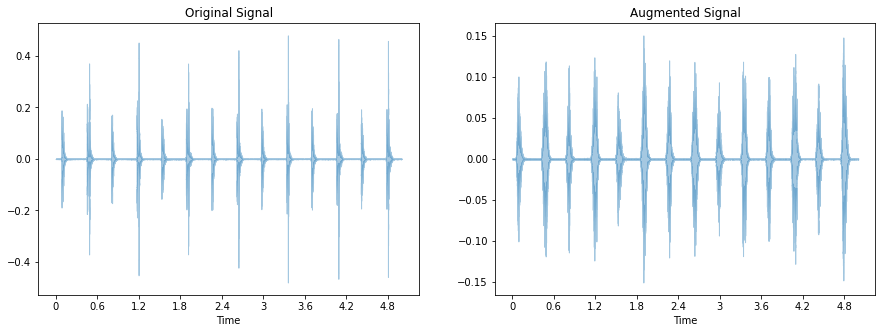

In [23]:
# Pitch shifting (increase/decrease frequency), no change to tempo
augment = Compose([
    PitchShift(min_semitones=-12, max_semitones=12, p=1.0)
])

augmented_signal = augment(samples=signal, sample_rate=sr)

# Display Waveform
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
librosa.display.waveshow(signal, sr=sr, alpha=0.4, ax=axs[0])
librosa.display.waveshow(augmented_signal, sr=sr, alpha=0.4, ax=axs[1])
axs[0].set_title('Original Signal')
axs[1].set_title('Augmented Signal')

Audio(augmented_signal, rate=sr)

In [24]:
# Write augmented stream to file
sf.write('aug_example/pitch.wav', augmented_signal, sr)

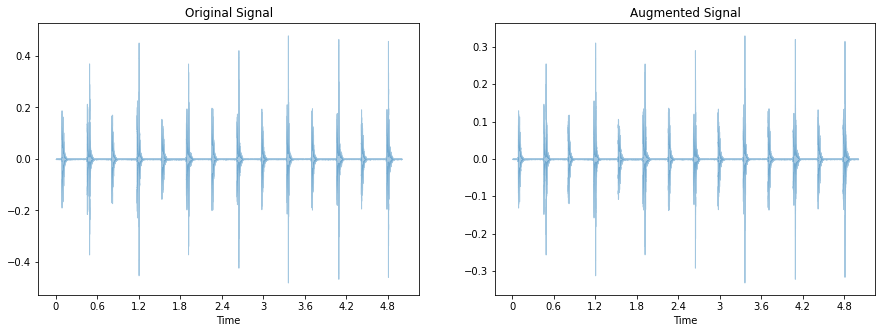

In [25]:
# Gain (increase/decrease loudness)
augment = Compose([
    Gain(min_gain_in_db=-10, max_gain_in_db=10, p=1.0)
])

augmented_signal = augment(samples=signal, sample_rate=sr)

# Display Waveform
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
librosa.display.waveshow(signal, sr=sr, alpha=0.4, ax=axs[0])
librosa.display.waveshow(augmented_signal, sr=sr, alpha=0.4, ax=axs[1])
axs[0].set_title('Original Signal')
axs[1].set_title('Augmented Signal')

Audio(augmented_signal, rate=sr, normalize=False)

In [26]:
# Write augmented stream to file
sf.write('aug_example/gain.wav', augmented_signal, sr)

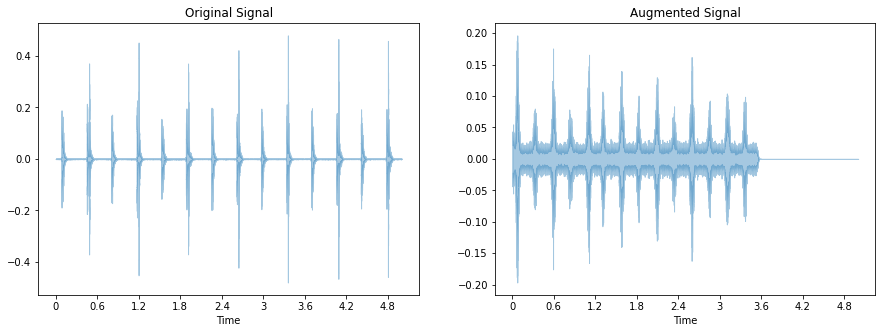

In [30]:
# Pipeline with all augmentations, whereas every augmentation is performed with p=1.0
augment = Compose([
    AddGaussianNoise(min_amplitude=0.001, max_amplitude=0.015, p=1.0),
    Shift(min_fraction=-1, max_fraction=1, p=1.0),
    TimeStretch(min_rate=0.5, max_rate=1.5, p=1.0),
    PitchShift(min_semitones=-12, max_semitones=12, p=1.0),
    Gain(min_gain_in_db=-10, max_gain_in_db=10, p=1.0)
])

augmented_signal = augment(samples=signal, sample_rate=sr)

# Display Waveform
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
librosa.display.waveshow(signal, sr=sr, alpha=0.4, ax=axs[0])
librosa.display.waveshow(augmented_signal, sr=sr, alpha=0.4, ax=axs[1])
axs[0].set_title('Original Signal')
axs[1].set_title('Augmented Signal')

Audio(augmented_signal, rate=sr, normalize=False)

In [31]:
# Write augmented stream to file
sf.write('aug_example/combine.wav', augmented_signal, sr)

In [32]:
# Another example augmentations
example_path = os.path.join(source_path, '1-17124-A-43.wav')
signal, sr = librosa.load(example_path, sr=None)

Audio(signal, rate=sr)

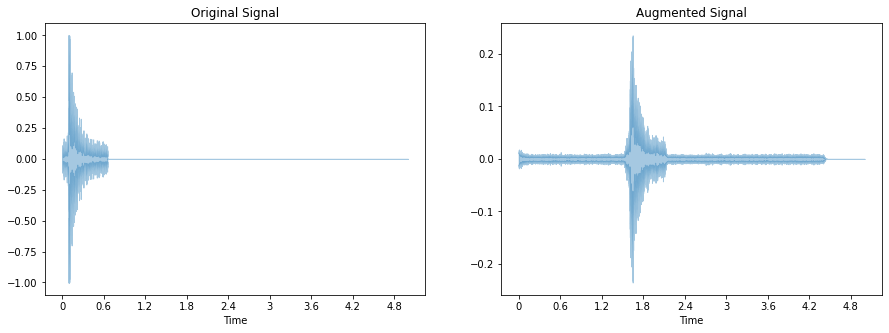

In [34]:
augmented_signal = augment(samples=signal, sample_rate=sr)

# Display Waveform
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
librosa.display.waveshow(signal, sr=sr, alpha=0.4, ax=axs[0])
librosa.display.waveshow(augmented_signal, sr=sr, alpha=0.4, ax=axs[1])
axs[0].set_title('Original Signal')
axs[1].set_title('Augmented Signal')

Audio(augmented_signal, rate=sr, normalize=False)

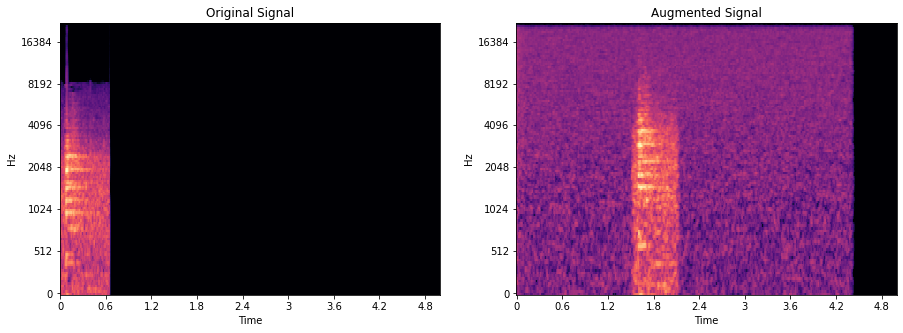

In [37]:
# Create Mel spectrogram original and augmented
mel = librosa.feature.melspectrogram(signal, sr=sr, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels)
mel_db = librosa.power_to_db(mel)

mel_aug = librosa.feature.melspectrogram(augmented_signal, sr=sr, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels)
mel_db_aug = librosa.power_to_db(mel_aug)

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
librosa.display.specshow(mel_db, x_axis='time', y_axis='mel', ax=axs[0], sr=sr, hop_length=hop_length, cmap='magma')
librosa.display.specshow(mel_db_aug, x_axis='time', y_axis='mel', ax=axs[1], sr=sr, hop_length=hop_length, cmap='magma')
axs[0].set_title('Original Signal')
axs[1].set_title('Augmented Signal')
plt.show()

In [97]:
preprocessed_augmented_data = []

# Iterate through training files and create an augmented version for each, i.e. double the amount of training data
for file_train in tqdm(files_train):
    
    # Load file
    file_path = os.path.join(source_path, file_train)
    signal, sr = librosa.load(file_path, sr=sr_all)

    # Augment data
    augmented_signal = augment(samples=signal, sample_rate=sr)

    # Create Mel Spectrogram and convert to db scale
    mel = librosa.feature.melspectrogram(augmented_signal, sr=sr, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels)
    mel_db = librosa.power_to_db(mel)
    mel_db = mel_db.reshape(1, mel_db.shape[0], mel_db.shape[1])
    
    # Extract class label from file name
    label_org = int(file_train.split('-')[-1].split('.')[0])
    
    # Get new label from label map
    label = label_map[label_org]

    preprocessed_augmented_data.append({
        'original_file': file_train,
        'label': label,
        'signal': augmented_signal,
        'mel_db': mel_db
    })

preprocessed_augmented_data_df = pd.DataFrame(preprocessed_augmented_data)
preprocessed_augmented_data_df.head()

100%|██████████| 256/256 [02:15<00:00,  1.89it/s]


,original_file,label,signal,mel_db
0,4-198965-A-38.wav,7,"[-0.0054802597, -0.0038028287, 0.0004848113, -...","[[[-21.934002, -19.716337, -21.716616, -27.575..."
1,5-221518-A-21.wav,6,"[-0.0008060812, -0.0067617483, -0.0058536627, ...","[[[-36.12893, -36.12439, -35.698, -33.352333, ..."
2,3-120644-A-12.wav,4,"[-0.0012799372, 0.00018340613, 0.00279705, 0.0...","[[[0.7032878, 3.9970121, 4.408907, 2.013706, -..."
3,2-118104-A-21.wav,6,"[0.00020468842, -0.0016054737, -0.0004374784, ...","[[[-38.96955, -38.305336, -42.408672, -46.3244..."
4,2-28314-B-12.wav,4,"[-0.0023565497, 0.013027733, 0.032121494, 0.02...","[[[-13.477949, -6.6325307, -6.4565616, -6.2998..."


In [98]:
# Save data
preprocessed_augmented_data_df.to_pickle('preprocessed_augmented_data_esc10.pkl')

In [99]:
preprocessed_augmented_data_df.count()

original_file    256
label            256
signal           256
mel_db           256
dtype: int64

In [185]:
# Load data
preprocessed_augmented_data_df = pd.read_pickle('preprocessed_augmented_data_esc10.pkl')

In [186]:
X_aug = preprocessed_augmented_data_df['mel_db'].values
X_aug = np.concatenate(X_aug, axis=0)

n_aug_recs = X_aug.shape[0]
n_aug_rows = X_aug.shape[1]
n_aug_cols = X_aug.shape[2]

X_aug = X_aug.reshape(n_aug_recs, n_aug_rows*n_aug_cols) # Flatten for StandardScaling
X_aug.shape

(256, 55168)

In [187]:
# Concat original train and augmented train data
X_train_all = np.concatenate([X_aug, X_train], axis=0)
X_train_all.shape

(512, 55168)

In [188]:
# To categorical of augmented labels and validation labels and concat with original train labels
y_aug = preprocessed_augmented_data_df['label'].values
y_aug = to_categorical(y_aug, num_classes=num_classes)
y_aug.shape

(256, 10)

In [189]:
y_train_all = np.concatenate([y_aug, y_train], axis=0)
y_train_all.shape

(512, 10)

In [190]:
# Fit StandardScaler on training data incl. augmented data and transform valid and test set
scaler = StandardScaler()
X_train_all_std = scaler.fit_transform(X_train_all)
X_valid_std = scaler.transform(X_valid)
X_test_std = scaler.transform(X_test)

X_train_all_std = X_train_all_std.reshape(X_train_all.shape[0], n_rows, n_cols, 1) # Reshape to 4D - needed for CCN
X_valid_std = X_valid_std.reshape(X_valid.shape[0], n_rows, n_cols, 1)
X_test_std = X_test_std.reshape(X_test.shape[0], n_rows, n_cols, 1)

print(X_train_all_std.shape, X_valid_std.shape, X_test_std.shape)

(512, 128, 431, 1) (64, 128, 431, 1) (80, 128, 431, 1)


In [195]:
# Build and train CNN
model = Sequential([
    Conv2D(filters=64, kernel_size=10, strides=2, padding='same', activation='relu', input_shape=(n_rows, n_cols, 1)),
    MaxPool2D(pool_size=2, strides=2, padding='same'),
    Conv2D(filters=32, kernel_size=10, strides=2, padding='same', activation='relu'),
    MaxPool2D(pool_size=2, strides=2, padding='same'),
    Conv2D(filters=32, kernel_size=5, strides=2, padding='same', activation='relu'),
    MaxPool2D(pool_size=2, strides=2, padding='same'),
    Flatten(),
    Dropout(0.5),
    Dense(units=150, activation='relu'),
    Dense(units=num_classes, activation='softmax')
])

model.summary()

# Model checkpoint to save best model
checkpoint_path = 'models/best_model_esc10_aug_mel'
checkpoint = ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')

early_stopping = EarlyStopping(monitor='val_loss', patience=5)

# Compile the model with adam optimizer and default settings
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Fit
history = model.fit(X_train_all_std, y_train_all, epochs=20, validation_data=(X_valid_std, y_valid), batch_size=64, callbacks=[checkpoint])

Model: "sequential_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_13 (Conv2D)           (None, 64, 216, 64)       6464      
_________________________________________________________________
max_pooling2d_13 (MaxPooling (None, 32, 108, 64)       0         
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 16, 54, 32)        204832    
_________________________________________________________________
max_pooling2d_14 (MaxPooling (None, 8, 27, 32)         0         
_________________________________________________________________
conv2d_15 (Conv2D)           (None, 4, 14, 32)         25632     
_________________________________________________________________
max_pooling2d_15 (MaxPooling (None, 2, 7, 32)          0         
_________________________________________________________________
flatten_5 (Flatten)          (None, 448)             

INFO:tensorflow:Assets written to: models\best_model_esc10_aug_mel\assets


Epoch 2/20
8/8 [==============================] - 13s 2s/step - loss: 2.0110 - accuracy: 0.2199 - val_loss: 1.6305 - val_accuracy: 0.2812

Epoch 00002: val_accuracy improved from 0.26562 to 0.28125, saving model to models\best_model_esc10_aug_mel
INFO:tensorflow:Assets written to: models\best_model_esc10_aug_mel\assets


INFO:tensorflow:Assets written to: models\best_model_esc10_aug_mel\assets


Epoch 3/20
8/8 [==============================] - 14s 2s/step - loss: 1.8502 - accuracy: 0.3206 - val_loss: 1.3964 - val_accuracy: 0.4062

Epoch 00003: val_accuracy improved from 0.28125 to 0.40625, saving model to models\best_model_esc10_aug_mel
INFO:tensorflow:Assets written to: models\best_model_esc10_aug_mel\assets


INFO:tensorflow:Assets written to: models\best_model_esc10_aug_mel\assets


Epoch 4/20
8/8 [==============================] - 14s 2s/step - loss: 1.6290 - accuracy: 0.4078 - val_loss: 1.2623 - val_accuracy: 0.5781

Epoch 00004: val_accuracy improved from 0.40625 to 0.57812, saving model to models\best_model_esc10_aug_mel
INFO:tensorflow:Assets written to: models\best_model_esc10_aug_mel\assets


INFO:tensorflow:Assets written to: models\best_model_esc10_aug_mel\assets


Epoch 5/20
8/8 [==============================] - 14s 2s/step - loss: 1.4048 - accuracy: 0.4573 - val_loss: 1.0401 - val_accuracy: 0.6250

Epoch 00005: val_accuracy improved from 0.57812 to 0.62500, saving model to models\best_model_esc10_aug_mel
INFO:tensorflow:Assets written to: models\best_model_esc10_aug_mel\assets


INFO:tensorflow:Assets written to: models\best_model_esc10_aug_mel\assets


Epoch 6/20
8/8 [==============================] - 15s 2s/step - loss: 1.2794 - accuracy: 0.5080 - val_loss: 0.9510 - val_accuracy: 0.6250

Epoch 00006: val_accuracy did not improve from 0.62500
Epoch 7/20
8/8 [==============================] - 18s 2s/step - loss: 1.1396 - accuracy: 0.6129 - val_loss: 0.8842 - val_accuracy: 0.6406

Epoch 00007: val_accuracy improved from 0.62500 to 0.64062, saving model to models\best_model_esc10_aug_mel
INFO:tensorflow:Assets written to: models\best_model_esc10_aug_mel\assets


INFO:tensorflow:Assets written to: models\best_model_esc10_aug_mel\assets


Epoch 8/20
8/8 [==============================] - 18s 2s/step - loss: 1.0376 - accuracy: 0.6439 - val_loss: 0.8334 - val_accuracy: 0.6562

Epoch 00008: val_accuracy improved from 0.64062 to 0.65625, saving model to models\best_model_esc10_aug_mel
INFO:tensorflow:Assets written to: models\best_model_esc10_aug_mel\assets


INFO:tensorflow:Assets written to: models\best_model_esc10_aug_mel\assets


Epoch 9/20
8/8 [==============================] - 19s 2s/step - loss: 1.0272 - accuracy: 0.6393 - val_loss: 0.7389 - val_accuracy: 0.6719

Epoch 00009: val_accuracy improved from 0.65625 to 0.67188, saving model to models\best_model_esc10_aug_mel
INFO:tensorflow:Assets written to: models\best_model_esc10_aug_mel\assets


INFO:tensorflow:Assets written to: models\best_model_esc10_aug_mel\assets


Epoch 10/20
8/8 [==============================] - 19s 2s/step - loss: 0.8683 - accuracy: 0.6837 - val_loss: 0.7114 - val_accuracy: 0.7188

Epoch 00010: val_accuracy improved from 0.67188 to 0.71875, saving model to models\best_model_esc10_aug_mel
INFO:tensorflow:Assets written to: models\best_model_esc10_aug_mel\assets


INFO:tensorflow:Assets written to: models\best_model_esc10_aug_mel\assets


Epoch 11/20
8/8 [==============================] - 21s 3s/step - loss: 0.7881 - accuracy: 0.7112 - val_loss: 0.7470 - val_accuracy: 0.7188

Epoch 00011: val_accuracy did not improve from 0.71875
Epoch 12/20
8/8 [==============================] - 20s 2s/step - loss: 0.7363 - accuracy: 0.7387 - val_loss: 0.6132 - val_accuracy: 0.7969

Epoch 00012: val_accuracy improved from 0.71875 to 0.79688, saving model to models\best_model_esc10_aug_mel
INFO:tensorflow:Assets written to: models\best_model_esc10_aug_mel\assets


INFO:tensorflow:Assets written to: models\best_model_esc10_aug_mel\assets


Epoch 13/20
8/8 [==============================] - 18s 2s/step - loss: 0.6832 - accuracy: 0.7514 - val_loss: 0.6247 - val_accuracy: 0.7656

Epoch 00013: val_accuracy did not improve from 0.79688
Epoch 14/20
8/8 [==============================] - 18s 2s/step - loss: 0.6359 - accuracy: 0.7694 - val_loss: 0.5656 - val_accuracy: 0.7969

Epoch 00014: val_accuracy did not improve from 0.79688
Epoch 15/20
8/8 [==============================] - 17s 2s/step - loss: 0.5595 - accuracy: 0.7995 - val_loss: 0.7144 - val_accuracy: 0.7812

Epoch 00015: val_accuracy did not improve from 0.79688
Epoch 16/20
8/8 [==============================] - 19s 2s/step - loss: 0.4937 - accuracy: 0.8137 - val_loss: 0.6433 - val_accuracy: 0.7812

Epoch 00016: val_accuracy did not improve from 0.79688
Epoch 17/20
8/8 [==============================] - 22s 3s/step - loss: 0.4023 - accuracy: 0.8463 - val_loss: 0.7416 - val_accuracy: 0.7812

Epoch 00017: val_accuracy did not improve from 0.79688
Epoch 18/20
8/8 [========

INFO:tensorflow:Assets written to: models\best_model_esc10_aug_mel\assets


Epoch 20/20
8/8 [==============================] - 17s 2s/step - loss: 0.3562 - accuracy: 0.8674 - val_loss: 0.5374 - val_accuracy: 0.8281

Epoch 00020: val_accuracy improved from 0.81250 to 0.82812, saving model to models\best_model_esc10_aug_mel
INFO:tensorflow:Assets written to: models\best_model_esc10_aug_mel\assets


INFO:tensorflow:Assets written to: models\best_model_esc10_aug_mel\assets


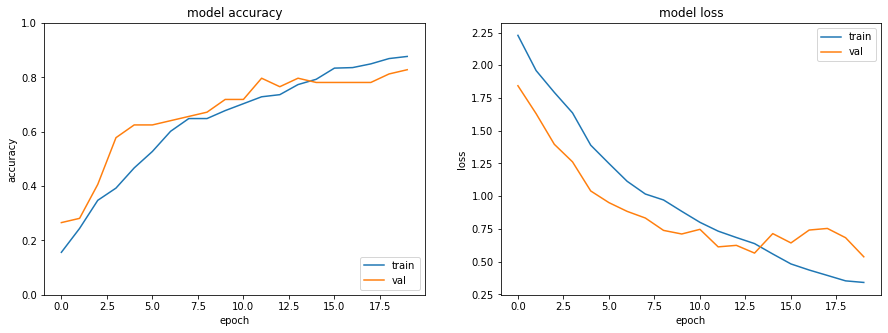

3/3 [==============================] - 1s 137ms/step - loss: 0.7091 - accuracy: 0.8500
Test loss: 0.7091293334960938
Test accuracy: 0.8500000238418579


                precision    recall  f1-score   support

           dog       1.00      0.75      0.86         8
       rooster       1.00      1.00      1.00         8
          rain       1.00      0.50      0.67         8
     sea_waves       0.60      0.75      0.67         8
crackling_fire       1.00      0.62      0.77         8
   crying_baby       1.00      1.00      1.00         8
      sneezing       0.80      1.00      0.89         8
    clock_tick       0.67      1.00      0.80         8
    helicopter       0.88      0.88      0.88         8
      chainsaw       0.89      1.00      0.94         8

      accuracy                           0.85        80
     macro avg       0.88      0.85      0.85        80
  weighted avg       0.88      0.85      0.85        80



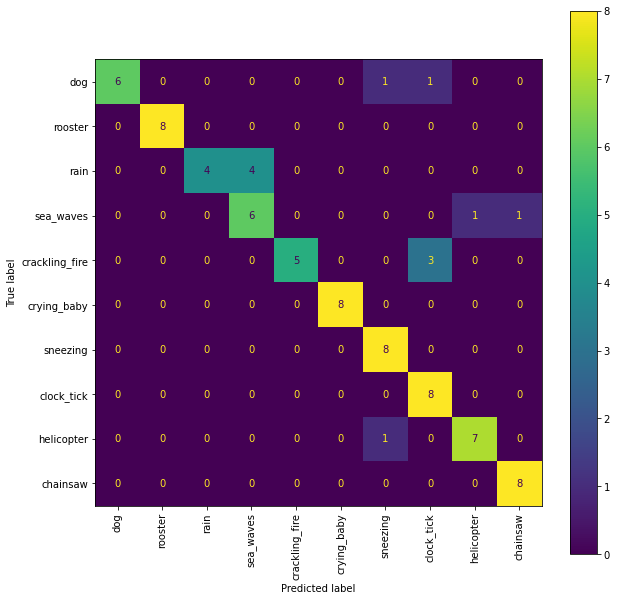

In [197]:
# Load best model
model = tf.keras.models.load_model(checkpoint_path)

# Plot training history
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

# Plot training accuracy history
axs[0].plot(history.history['accuracy'])
axs[0].plot(history.history['val_accuracy'])
axs[0].set_title('model accuracy')
axs[0].set_ylabel('accuracy')
axs[0].set_xlabel('epoch')
axs[0].set_ylim(0,1)
axs[0].legend(['train', 'val'], loc='lower right')

axs[1].plot(history.history['loss'])
axs[1].plot(history.history['val_loss'])
axs[1].set_title('model loss')
axs[1].set_ylabel('loss')
axs[1].set_xlabel('epoch')
axs[1].legend(['train', 'val'], loc='upper right')

plt.show()

test_loss, test_accuracy = model.evaluate(X_test_std, y_test)

print(f'Test loss: {test_loss}')
print(f'Test accuracy: {test_accuracy}')

y_pred_proba = model.predict(X_test_std)
y_pred_test = np.array([np.argmax(y) for y in y_pred_proba])
y_true_test = np.array([np.argmax(y) for y in y_test])

# Classification Report
print(classification_report(y_true_test, y_pred_test, target_names=label_names))

# Confusion matrix
fig, ax = plt.subplots(figsize=(10,10))
cmp = ConfusionMatrixDisplay.from_predictions(y_true_test, y_pred_test, display_labels=label_names, xticks_rotation='vertical', ax=ax)
plt.show()

### 2.4. Multiple experiments with CNN and augmentation
Run a set of experiments with different augmentations, keep feature extraction and CNN fixed
- Without augmentation (= 256 training data records)
- Create 1 augmented record for each original training data record (= 512 training data records in total)
- Create 5 augmented records for each original training data (= 1536 training data records in total)

In [2]:
source_path = Path('../ESC-50-master/audio')
metadata_path = os.path.join('../ESC-50-master/meta/esc50.csv')
metadata_df = pd.read_csv(metadata_path)
metadata_esc10_df = metadata_df[metadata_df['esc10']]
esc10_files = metadata_esc10_df['filename'].values

In [3]:
def extract_mel_spectrogram(sr, n_fft, hop_length, n_mels):
    
    # Create spectrograms for all ESC-10 files
    preprocessed_data = []

    for file in tqdm(esc10_files):

        # Load file
        file_path = os.path.join(source_path, file)
        signal, sr = librosa.load(file_path, sr=sr)

        # Create Mel Spectrogram and convert to db scale
        mel = librosa.feature.melspectrogram(signal, sr=sr, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels)
        mel_db = librosa.power_to_db(mel)
        mel_db = mel_db.reshape(1, mel_db.shape[0], mel_db.shape[1])

        # Extract class label from filename
        label_org = int(file.split('-')[-1].split('.')[0])

        # Get new label from label map
        label = label_map[label_org]

        preprocessed_data.append({
            'file': file,
            'label': label,
            'signal': signal,
            'mel_db': mel_db
        })

    preprocessed_data_df = pd.DataFrame(preprocessed_data)
    
    return preprocessed_data_df

In [4]:
def split_data(preprocessed_data_df):
    
    # Spectrogram feature
    X = preprocessed_data_df['mel_db'].values
    X = np.concatenate(X, axis=0)

    n_recs = X.shape[0]
    n_rows = X.shape[1]
    n_cols = X.shape[2]

    X = X.reshape(n_recs, n_rows*n_cols) # Flatten for StandardScaling

    # Target variable
    y = preprocessed_data_df['label'].values
    y = to_categorical(y, num_classes=num_classes)

    # Filenames
    files = preprocessed_data_df['file'].values

    # Train/test split with stratify on y (we want all digits being evenly represented in train and test)
    X_train, X_test, y_train, y_test, files_train, files_test = train_test_split(X, y, files, test_size=0.2, stratify=y, random_state=42)
    
    # Split train set from above in train and valid set, so we have train, valid and test set
    X_train, X_valid, y_train, y_valid, files_train, files_valid = train_test_split(X_train, y_train, files_train, test_size=0.2, stratify=y_train, random_state=42)

    # Fit StandardScaler on training data
    scaler = StandardScaler()
    X_train_std = scaler.fit_transform(X_train)
    X_valid_std = scaler.transform(X_valid)
    X_test_std = scaler.transform(X_test)

    X_train_std = X_train_std.reshape(X_train.shape[0], n_rows, n_cols, 1) # Reshape to 4D - needed for CCN
    X_valid_std = X_valid_std.reshape(X_valid.shape[0], n_rows, n_cols, 1)
    X_test_std = X_test_std.reshape(X_test.shape[0], n_rows, n_cols, 1)

    return X_train_std, X_valid_std, X_test_std, X_train, X_valid, X_test, y_train, y_valid, y_test, files_train

In [5]:
def create_augmented_data(n_augmentation_per_train,
                          p_per_augmentation,
                          X_train,
                          X_valid,
                          X_test,
                          y_train,
                          files_train, 
                          sr, 
                          n_fft, 
                          hop_length, 
                          n_mels):
    
    # Pipeline with all augmentations, whereas every augmentation is performed with p=1.0
    augment = Compose([
        AddGaussianNoise(min_amplitude=0.001, max_amplitude=0.015, p=p_per_augmentation),
        Shift(min_fraction=-1, max_fraction=1, p=p_per_augmentation),
        TimeStretch(min_rate=0.5, max_rate=1.5, p=p_per_augmentation),
        PitchShift(min_semitones=-12, max_semitones=12, p=p_per_augmentation),
        Gain(min_gain_in_db=-10, max_gain_in_db=10, p=p_per_augmentation)
    ])
    
    preprocessed_augmented_data = []

    # Iterate through training files and create an augmented version for each, i.e. double the amount of training data
    for file_train in tqdm(files_train):
        
        # Load file
        file_path = os.path.join(source_path, file_train)
        signal, sr = librosa.load(file_path, sr=sr)
        
        # For each training file, create n_augmentation_per_train augmented file
        for i in range(n_augmentation_per_train):      

            # Augment data
            augmented_signal = augment(samples=signal, sample_rate=sr)

            # Create Mel Spectrogram and convert to db scale
            mel = librosa.feature.melspectrogram(augmented_signal, sr=sr, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels)
            mel_db = librosa.power_to_db(mel)
            mel_db = mel_db.reshape(1, mel_db.shape[0], mel_db.shape[1])

            # Extract class label from file name
            label_org = int(file_train.split('-')[-1].split('.')[0])

            # Get new label from label map
            label = label_map[label_org]

            preprocessed_augmented_data.append({
                'original_file': file_train,
                'label': label,
                'signal': augmented_signal,
                'mel_db': mel_db
            })

    preprocessed_augmented_data_df = pd.DataFrame(preprocessed_augmented_data)
    
    X_aug = preprocessed_augmented_data_df['mel_db'].values
    X_aug = np.concatenate(X_aug, axis=0)

    n_aug_recs = X_aug.shape[0]
    n_aug_rows = X_aug.shape[1]
    n_aug_cols = X_aug.shape[2]

    X_aug = X_aug.reshape(n_aug_recs, n_aug_rows*n_aug_cols) # Flatten for StandardScaling
    X_train_all = np.concatenate([X_aug, X_train], axis=0)
    
    # To categorical of augmented labels and validation labels and concat with original train labels
    y_aug = preprocessed_augmented_data_df['label'].values
    y_aug = to_categorical(y_aug, num_classes=num_classes)
    y_train_all = np.concatenate([y_aug, y_train], axis=0)
       
    # Fit StandardScaler on training data incl. augmented data and transform valid and test set
    scaler = StandardScaler()
    X_train_all_std = scaler.fit_transform(X_train_all)
    X_valid_std = scaler.transform(X_valid)
    X_test_std = scaler.transform(X_test)

    X_train_all_std = X_train_all_std.reshape(X_train_all.shape[0], n_aug_rows, n_aug_cols, 1) # Reshape to 4D - needed for CCN
    X_valid_std = X_valid_std.reshape(X_valid.shape[0], n_aug_rows, n_aug_cols, 1)
    X_test_std = X_test_std.reshape(X_test.shape[0], n_aug_rows, n_aug_cols, 1)
    
    return X_train_all_std, X_valid_std, X_test_std, y_train_all

In [6]:
def build_run_training(experiment_id,
                       repetition_id,
                       X_train_std,
                       X_valid_std,
                       X_test_std,
                       y_train,
                       y_valid,
                       y_test,
                       n_filters_l1, 
                       n_filters_l2, 
                       n_filters_l3, 
                       n_dense_layer,
                       batch_size,
                       epochs):
    
    n_rows = X_train_std.shape[1]
    n_cols = X_train_std.shape[2]
    
    # Build and train CNN
    model = Sequential([
        Conv2D(filters=n_filters_l1, kernel_size=10, strides=2, padding='same', activation='relu', input_shape=(n_rows, n_cols, 1)),
        MaxPool2D(pool_size=2, strides=2, padding='same'),
        Conv2D(filters=n_filters_l2, kernel_size=10, strides=2, padding='same', activation='relu'),
        MaxPool2D(pool_size=2, strides=2, padding='same'),
        Conv2D(filters=n_filters_l3, kernel_size=5, strides=2, padding='same', activation='relu'),
        MaxPool2D(pool_size=2, strides=2, padding='same'),
        Flatten(),
        Dropout(0.5),
        Dense(units=n_dense_layer, activation='relu'),
        Dense(units=num_classes, activation='softmax')
    ])

    # Model checkpoint to save best model
    checkpoint_path = f'models/best_model_esc10_exp_{experiment_id}_{repetition_id}'
    checkpoint = ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max', save_weights_only=True)

    # Compile the model with adam optimizer and default settings
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

    # Fit
    history = model.fit(X_train_std, y_train, epochs=epochs, validation_data=(X_valid_std, y_valid), batch_size=batch_size, callbacks=[checkpoint], verbose=1)
    
    # Load best weights
    model.load_weights(checkpoint_path)
    
    # Test
    test_loss, test_accuracy = model.evaluate(X_test_std, y_test, verbose=0)
    
    return history, test_accuracy

In [7]:
# Define some constants
num_classes = 10 # For ESC10
n_repetitions = 20 # Number of repetitions for same experiment

# Remap original labels for ESC10 data
label_map = {
    0: 0,  # dog
    1: 1,  # rooster
    10: 2, # rain
    11: 3, # sea_waves
    12: 4, # crackling_fire
    20: 5, # crying_baby
    21: 6, # sneezing
    38: 7, # clock_tick
    40: 8, # helicopter
    41: 9  # chainsaw
}

label_names = [
    'dog',
    'rooster',
    'rain',
    'sea_waves',
    'crackling_fire',
    'crying_baby',
    'sneezing',
    'clock_tick',
    'helicopter',
    'chainsaw'
]

# Define different augmentation setups, i.e. number of augmentation per training dataset and p per augmentation
feature_extraction_setups = [
    {
        'sr': 44100,
        'n_fft': 2048,
        'hop_length': 512,
        'n_mels': 128
    }
]

augmentation_setups = [
    {
        'n_augmentation_per_train': 0, # No augmentation
        'p_per_augmentation': 0.0
    },
    {
        'n_augmentation_per_train': 1,
        'p_per_augmentation': 0.5
    },
    {
        'n_augmentation_per_train': 5,
        'p_per_augmentation': 0.5
    }
]

cnn_setups = [
    {
        'n_filters_l1': 64,
        'n_filters_l2': 32,
        'n_filters_l3': 32,
        'n_dense_layer': 150,
        'batch_size': 64,
        'epochs': 20
    }
]

In [9]:
%%time

# Loop through feature extraction setups
experiment_id = 0

experiment_results = []

for feature_extraction in feature_extraction_setups:
    
    print(feature_extraction)
    sr = feature_extraction['sr']
    n_fft = feature_extraction['n_fft']
    hop_length = feature_extraction['hop_length']
    n_mels = feature_extraction['n_mels']
    
    # Extract features
    preprocessed_data_df = extract_mel_spectrogram(sr, n_fft, hop_length, n_mels)
    
    # Create train/test split
    X_train_std_org, X_valid_std_org, X_test_std_org, X_train_org, X_valid_org, X_test_org, y_train_org, y_valid_org, y_test_org, files_train = split_data(preprocessed_data_df)
    print('Shape before augmentation: ', X_train_std_org.shape, X_valid_std_org.shape, X_test_std_org.shape)

    # Loop through augmentation setups
    for augmentation in augmentation_setups:
        
        print(augmentation)
        n_augmentation_per_train = augmentation['n_augmentation_per_train']
        p_per_augmentation = augmentation['p_per_augmentation']
        
        if n_augmentation_per_train != 0:
        
            X_train_std, X_valid_std, X_test_std, y_train = create_augmented_data(n_augmentation_per_train,
                                                                                  p_per_augmentation,
                                                                                  X_train_org,
                                                                                  X_valid_org,
                                                                                  X_test_org,
                                                                                  y_train_org,
                                                                                  files_train, 
                                                                                  sr, 
                                                                                  n_fft, 
                                                                                  hop_length, 
                                                                                  n_mels)

        else:
            
            X_train_std = X_train_std_org
            X_valid_std = X_valid_std_org
            X_test_std = X_test_std_org
            y_train = y_train_org
            
        print('Shape after augmentation: ', X_train_std.shape, y_train.shape, X_valid_std.shape, X_test_std.shape)
        
        # Save X_test_std and y_test_org with experiment_id for later test analysis with best model
        # Save is needed because test data gets scaled based on training data and training data is influenced by augmentation
        np.save(f'X_test_std_{experiment_id}', X_test_std)
        np.save(f'y_test_org_{experiment_id}', y_test_org)
        
        # Loop trough CNN setups
        for cnn in cnn_setups:
            
            print(cnn)
            n_filters_l1 = cnn['n_filters_l1']
            n_filters_l2 = cnn['n_filters_l2']
            n_filters_l3 = cnn['n_filters_l3']
            n_dense_layer = cnn['n_dense_layer']
            batch_size = cnn['batch_size']
            epochs = cnn['epochs']  
            
            for repetition_id in range(n_repetitions):
            
                history, test_accuracy = build_run_training(experiment_id,
                                                            repetition_id,
                                                            X_train_std,
                                                            X_valid_std,
                                                            X_test_std,
                                                            y_train,
                                                            y_valid_org,
                                                            y_test_org,
                                                            n_filters_l1, 
                                                            n_filters_l2, 
                                                            n_filters_l3, 
                                                            n_dense_layer,
                                                            batch_size,
                                                            epochs)

                print('Test accuracy: ', test_accuracy)
            
                # Add everything to experiment results
                experiment_results.append({
                    'experiment_id': experiment_id,
                    'repetition_id': repetition_id,
                    'sr': sr,
                    'n_fft': n_fft,
                    'hop_length': hop_length,
                    'n_mels': n_mels,
                    'n_augmentation_per_train': n_augmentation_per_train,
                    'p_per_augmentation': p_per_augmentation,
                    'n_filters_l1': n_filters_l1,
                    'n_filters_l2': n_filters_l2,
                    'n_filters_l3': n_filters_l3,
                    'n_dense_layer': n_dense_layer,
                    'batch_size': batch_size,
                    'epochs': epochs,
                    'history_accuracy': history.history['accuracy'],
                    'history_val_accuracy': history.history['val_accuracy'],
                    'history_loss': history.history['loss'],
                    'history_val_loss': history.history['val_loss'],
                    'test_accuracy': test_accuracy
                })
            
            experiment_id += 1
            
experiment_results_df = pd.DataFrame(experiment_results)

# Save experiment results and Testdata
experiment_results_df.to_pickle('experiment_results_df.pkl')
experiment_results_df.head()

{'sr': 44100, 'n_fft': 2048, 'hop_length': 512, 'n_mels': 128}


100%|██████████| 400/400 [00:05<00:00, 66.94it/s]


Shape before augmentation:  (256, 128, 431, 1) (64, 128, 431, 1) (80, 128, 431, 1)
{'n_augmentation_per_train': 0, 'p_per_augmentation': 0.0}
Shape after augmentation:  (256, 128, 431, 1) (256, 10) (64, 128, 431, 1) (80, 128, 431, 1)
{'n_filters_l1': 64, 'n_filters_l2': 32, 'n_filters_l3': 32, 'n_dense_layer': 150, 'batch_size': 64, 'epochs': 20}
Epoch 1/20
4/4 [==============================] - 6s 2s/step - loss: 2.3424 - accuracy: 0.0969 - val_loss: 2.1278 - val_accuracy: 0.1875

Epoch 00001: val_accuracy improved from -inf to 0.18750, saving model to models\best_model_esc10_exp_0_0
Epoch 2/20
4/4 [==============================] - 6s 1s/step - loss: 2.1333 - accuracy: 0.2021 - val_loss: 1.9561 - val_accuracy: 0.2031

Epoch 00002: val_accuracy improved from 0.18750 to 0.20312, saving model to models\best_model_esc10_exp_0_0
Epoch 3/20
4/4 [==============================] - 6s 1s/step - loss: 1.9337 - accuracy: 0.2271 - val_loss: 1.7738 - val_accuracy: 0.3438

Epoch 00003: val_accurac

100%|██████████| 256/256 [01:04<00:00,  3.99it/s]


Shape after augmentation:  (512, 128, 431, 1) (512, 10) (64, 128, 431, 1) (80, 128, 431, 1)
{'n_filters_l1': 64, 'n_filters_l2': 32, 'n_filters_l3': 32, 'n_dense_layer': 150, 'batch_size': 64, 'epochs': 20}
Epoch 1/20
8/8 [==============================] - 14s 2s/step - loss: 2.3020 - accuracy: 0.1274 - val_loss: 1.9278 - val_accuracy: 0.2188

Epoch 00001: val_accuracy improved from -inf to 0.21875, saving model to models\best_model_esc10_exp_1_0
Epoch 2/20
8/8 [==============================] - 15s 2s/step - loss: 2.0079 - accuracy: 0.2181 - val_loss: 1.7209 - val_accuracy: 0.3906

Epoch 00002: val_accuracy improved from 0.21875 to 0.39062, saving model to models\best_model_esc10_exp_1_0
Epoch 3/20
8/8 [==============================] - 17s 2s/step - loss: 1.8098 - accuracy: 0.3314 - val_loss: 1.5862 - val_accuracy: 0.4375

Epoch 00003: val_accuracy improved from 0.39062 to 0.43750, saving model to models\best_model_esc10_exp_1_0
Epoch 4/20
8/8 [==============================] - 17s 2

100%|██████████| 256/256 [05:37<00:00,  1.32s/it]


Shape after augmentation:  (1536, 128, 431, 1) (1536, 10) (64, 128, 431, 1) (80, 128, 431, 1)
{'n_filters_l1': 64, 'n_filters_l2': 32, 'n_filters_l3': 32, 'n_dense_layer': 150, 'batch_size': 64, 'epochs': 20}
Epoch 1/20
24/24 [==============================] - 36s 2s/step - loss: 2.2164 - accuracy: 0.1761 - val_loss: 1.5723 - val_accuracy: 0.3281

Epoch 00001: val_accuracy improved from -inf to 0.32812, saving model to models\best_model_esc10_exp_2_0
Epoch 2/20
24/24 [==============================] - 44s 2s/step - loss: 1.6828 - accuracy: 0.3618 - val_loss: 1.0731 - val_accuracy: 0.6250

Epoch 00002: val_accuracy improved from 0.32812 to 0.62500, saving model to models\best_model_esc10_exp_2_0
Epoch 3/20
24/24 [==============================] - 48s 2s/step - loss: 1.3703 - accuracy: 0.4810 - val_loss: 0.8188 - val_accuracy: 0.6406

Epoch 00003: val_accuracy improved from 0.62500 to 0.64062, saving model to models\best_model_esc10_exp_2_0
Epoch 4/20
24/24 [=============================

,experiment_id,repetition_id,sr,n_fft,hop_length,n_mels,n_augmentation_per_train,p_per_augmentation,n_filters_l1,n_filters_l2,n_filters_l3,n_dense_layer,batch_size,epochs,history_accuracy,history_val_accuracy,history_loss,history_val_loss,test_accuracy
0,0,0,44100,2048,512,128,0,0.0,64,32,32,150,64,20,"[0.125, 0.203125, 0.2265625, 0.3515625, 0.3789...","[0.1875, 0.203125, 0.34375, 0.390625, 0.53125,...","[2.3199825286865234, 2.1081252098083496, 1.936...","[2.1278252601623535, 1.9560778141021729, 1.773...",0.8000
1,0,1,44100,2048,512,128,0,0.0,64,32,32,150,64,20,"[0.14453125, 0.27734375, 0.3125, 0.41796875, 0...","[0.28125, 0.359375, 0.34375, 0.4375, 0.515625,...","[2.2147462368011475, 1.989138126373291, 1.8013...","[1.9855751991271973, 1.707120656967163, 1.6498...",0.8125
2,0,2,44100,2048,512,128,0,0.0,64,32,32,150,64,20,"[0.15234375, 0.20703125, 0.24609375, 0.3632812...","[0.21875, 0.265625, 0.375, 0.421875, 0.59375, ...","[2.267695426940918, 2.135138988494873, 1.96798...","[2.0432863235473633, 1.8673837184906006, 1.738...",0.8250
3,0,3,44100,2048,512,128,0,0.0,64,32,32,150,64,20,"[0.12890625, 0.1875, 0.3046875, 0.375, 0.40234...","[0.21875, 0.359375, 0.375, 0.453125, 0.578125,...","[2.290428876876831, 2.0849320888519287, 1.8525...","[2.068817615509033, 1.8218265771865845, 1.6570...",0.8125
4,0,4,44100,2048,512,128,0,0.0,64,32,32,150,64,20,"[0.140625, 0.2265625, 0.31640625, 0.375, 0.441...","[0.140625, 0.328125, 0.40625, 0.453125, 0.4687...","[2.2845640182495117, 2.027144432067871, 1.8002...","[2.0867950916290283, 1.7636537551879883, 1.625...",0.7250


In [20]:
# Load experiment results of run 1 and run 2
experiment_results_run_1_df = pd.read_pickle('run_20220914/experiment_results_df.pkl')
experiment_results_run_2_df = pd.read_pickle('run_20220915/experiment_results_df.pkl')
experiment_results_run_3_df = pd.read_pickle('run_20220916/experiment_results_df.pkl')

experiment_results_run_1_df['run'] = 'run_1'
experiment_results_run_2_df['run'] = 'run_2'
experiment_results_run_3_df['run'] = 'run_3'

In [21]:
# Run 1 summary
experiment_results_run_1_df.groupby('experiment_id').describe()['test_accuracy']

,count,mean,std,min,25%,50%,75%,max
experiment_id,,,,,,,,
0,20.0,0.781875,0.037931,0.700,0.759375,0.7875,0.812500,0.8375
1,20.0,0.811875,0.048915,0.725,0.784375,0.8125,0.850000,0.9000
2,20.0,0.846250,0.036296,0.775,0.821875,0.8500,0.865625,0.9000


In [22]:
# Run 2 summary
experiment_results_run_2_df.groupby('experiment_id').describe()['test_accuracy']

,count,mean,std,min,25%,50%,75%,max
experiment_id,,,,,,,,
0,20.0,0.774375,0.042044,0.6875,0.746875,0.77500,0.8000,0.8375
1,20.0,0.816250,0.038281,0.7250,0.796875,0.81875,0.8375,0.8875
2,20.0,0.852500,0.039653,0.7875,0.825000,0.85625,0.8750,0.9125


In [23]:
# Run 3 summary
experiment_results_run_3_df.groupby('experiment_id').describe()['test_accuracy']

,count,mean,std,min,25%,50%,75%,max
experiment_id,,,,,,,,
0,20.0,0.778125,0.041334,0.6875,0.75625,0.79375,0.803125,0.8250
1,20.0,0.830000,0.037478,0.7625,0.80000,0.83125,0.862500,0.8875
2,20.0,0.849375,0.038576,0.7625,0.84375,0.85625,0.875000,0.8875


In [30]:
# Combined stats for run 1, run 2 and run 3
experiment_results_df = pd.concat([experiment_results_run_1_df, experiment_results_run_2_df, experiment_results_run_3_df]).reset_index()
experiment_results_df.groupby('experiment_id').describe()['test_accuracy']

,count,mean,std,min,25%,50%,75%,max
experiment_id,,,,,,,,
0,60.0,0.778125,0.039904,0.6875,0.750000,0.7875,0.803125,0.8375
1,60.0,0.819375,0.041898,0.7250,0.796875,0.8250,0.850000,0.9000
2,60.0,0.849375,0.037636,0.7625,0.825000,0.8500,0.875000,0.9125


In [31]:
# Top 5 results are all form augmentated trainings with best accuracy at 91% with 5-fold augmentation
experiment_results_df.sort_values(by='test_accuracy', ascending=False).head()

,index,experiment_id,repetition_id,sr,n_fft,hop_length,n_mels,n_augmentation_per_train,p_per_augmentation,n_filters_l1,...,n_filters_l3,n_dense_layer,batch_size,epochs,history_accuracy,history_val_accuracy,history_loss,history_val_loss,test_accuracy,run
116,56,2,16,44100,2048,512,128,5,0.5,64,...,32,150,64,20,"[0.208984375, 0.4173177182674408, 0.548828125,...","[0.421875, 0.6875, 0.734375, 0.796875, 0.8125,...","[2.0674281120300293, 1.5617119073867798, 1.211...","[1.6140172481536865, 1.0168728828430176, 0.739...",0.9125,run_2
107,47,2,7,44100,2048,512,128,5,0.5,64,...,32,150,64,20,"[0.19921875, 0.3743489682674408, 0.501953125, ...","[0.390625, 0.5625, 0.71875, 0.734375, 0.75, 0....","[2.111309289932251, 1.6299391984939575, 1.3285...","[1.6934683322906494, 1.258545160293579, 0.8326...",0.9125,run_2
106,46,2,6,44100,2048,512,128,5,0.5,64,...,32,150,64,20,"[0.1712239533662796, 0.3567708432674408, 0.508...","[0.28125, 0.609375, 0.703125, 0.765625, 0.75, ...","[2.1432950496673584, 1.6811304092407227, 1.308...","[1.7030054330825806, 1.169342041015625, 0.9625...",0.9000,run_2
111,51,2,11,44100,2048,512,128,5,0.5,64,...,32,150,64,20,"[0.2161458283662796, 0.4153645932674408, 0.549...","[0.484375, 0.609375, 0.8125, 0.734375, 0.84375...","[2.040602445602417, 1.561587929725647, 1.20079...","[1.5753347873687744, 1.0077776908874512, 0.704...",0.9000,run_2
45,45,2,5,44100,2048,512,128,5,0.5,64,...,32,150,64,20,"[0.1875, 0.3776041567325592, 0.51953125, 0.620...","[0.375, 0.671875, 0.734375, 0.8125, 0.828125, ...","[2.1302452087402344, 1.6840261220932007, 1.295...","[1.6193472146987915, 1.0902442932128906, 0.756...",0.9000,run_1


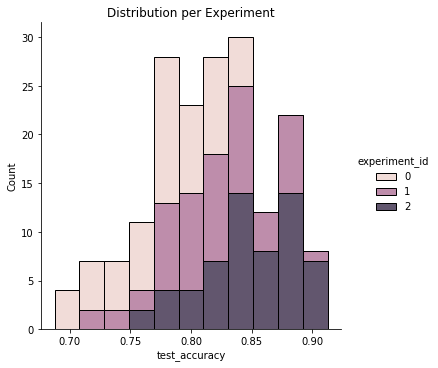

In [35]:
# Show accuracy distribution per experiment
sns.displot(data=experiment_results_df, x='test_accuracy', hue='experiment_id', multiple='stack')
plt.title('Distribution per Experiment')
plt.show()

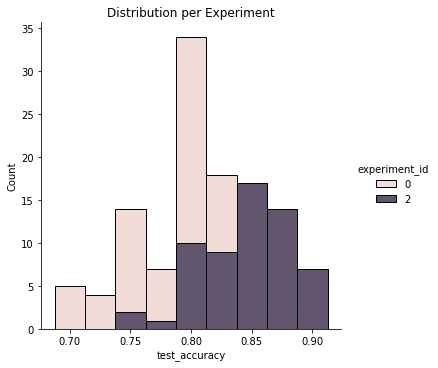

In [37]:
# Only no augmentation and 5-fold augmentation
sns.displot(data=experiment_results_df[experiment_results_df['experiment_id']!=1], x='test_accuracy', hue='experiment_id', multiple='stack')
plt.title('Distribution per Experiment')
plt.show()

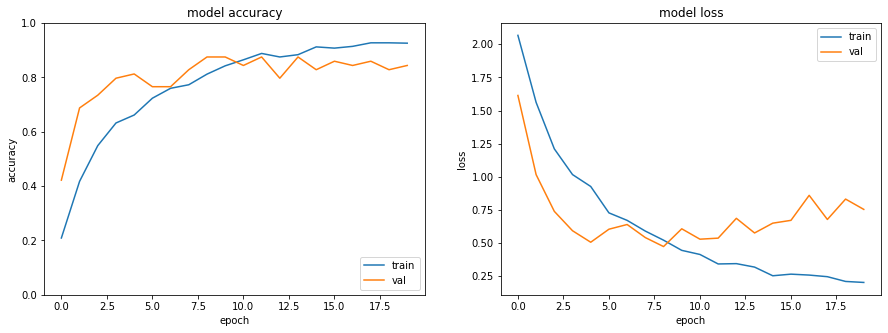

In [40]:
# Show training history of best model
best_model = experiment_results_df[(experiment_results_df['experiment_id']==2) & (experiment_results_df['repetition_id']==16) & (experiment_results_df['run']=='run_2')]
history_accuracy = best_model['history_accuracy'].values[0]
history_val_accuracy = best_model['history_val_accuracy'].values[0]
history_loss = best_model['history_loss'].values[0]
history_val_loss = best_model['history_val_loss'].values[0]

# Plot training history
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

axs[0].plot(history_accuracy)
axs[0].plot(history_val_accuracy)
axs[0].set_title('model accuracy')
axs[0].set_ylabel('accuracy')
axs[0].set_xlabel('epoch')
axs[0].set_ylim(0,1)
axs[0].legend(['train', 'val'], loc='lower right')

axs[1].plot(history_loss)
axs[1].plot(history_val_loss)
axs[1].set_title('model loss')
axs[1].set_ylabel('loss')
axs[1].set_xlabel('epoch')
axs[1].legend(['train', 'val'], loc='upper right')

fig.show()

3/3 [==============================] - 0s 87ms/step - loss: 0.3068 - accuracy: 0.9094
Test loss: 0.3201620578765869
Test accuracy: 0.9125000238418579
                precision    recall  f1-score   support

           dog       0.89      1.00      0.94         8
       rooster       1.00      1.00      1.00         8
          rain       1.00      0.62      0.77         8
     sea_waves       0.67      0.75      0.71         8
crackling_fire       1.00      0.88      0.93         8
   crying_baby       1.00      1.00      1.00         8
      sneezing       1.00      1.00      1.00         8
    clock_tick       0.89      1.00      0.94         8
    helicopter       0.78      0.88      0.82         8
      chainsaw       1.00      1.00      1.00         8

      accuracy                           0.91        80
     macro avg       0.92      0.91      0.91        80
  weighted avg       0.92      0.91      0.91        80



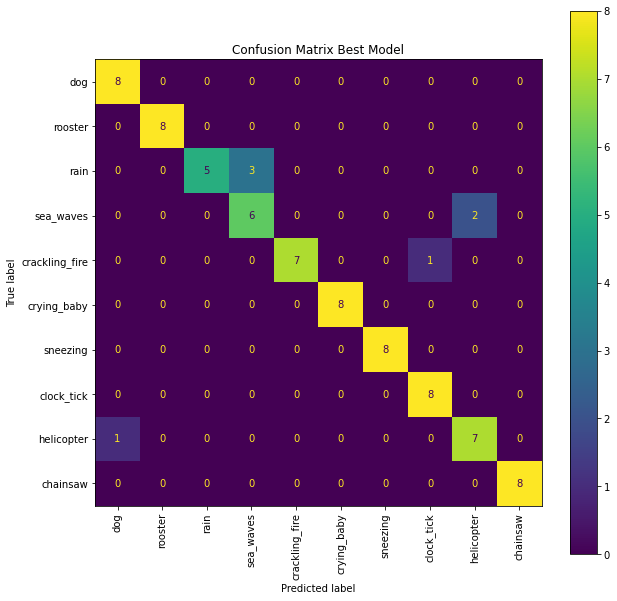

In [41]:
# Load test data of best experiment
X_test_data = np.load('run_20220915/X_test_std_2.npy')
y_test_data = np.load('run_20220915/y_test_org_2.npy')

# Evaluate on best model weights
n_rows = X_test_data.shape[1]
n_cols = X_test_data.shape[2]

# Build and train CNN
model = Sequential([
    Conv2D(filters=64, kernel_size=10, strides=2, padding='same', activation='relu', input_shape=(n_rows, n_cols, 1)),
    MaxPool2D(pool_size=2, strides=2, padding='same'),
    Conv2D(filters=32, kernel_size=10, strides=2, padding='same', activation='relu'),
    MaxPool2D(pool_size=2, strides=2, padding='same'),
    Conv2D(filters=32, kernel_size=5, strides=2, padding='same', activation='relu'),
    MaxPool2D(pool_size=2, strides=2, padding='same'),
    Flatten(),
    Dropout(0.5),
    Dense(units=150, activation='relu'),
    Dense(units=10, activation='softmax')
])

# Compile the model with adam optimizer and default settings
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Load best weights
weights_path = f'run_20220915/models/best_model_esc10_exp_2_16' # Best model
model.load_weights(weights_path)

# Evaluate
test_loss, test_accuracy = model.evaluate(X_test_data, y_test_data)

print(f'Test loss: {test_loss}')
print(f'Test accuracy: {test_accuracy}')

y_pred_proba = model.predict(X_test_data)
y_pred_test = np.array([np.argmax(y) for y in y_pred_proba])
y_true_test = np.array([np.argmax(y) for y in y_test_data])

# Classification Report
print(classification_report(y_true_test, y_pred_test, target_names=label_names))

# Confusion matrix
fig, ax = plt.subplots(figsize=(10,10))
cmp = ConfusionMatrixDisplay.from_predictions(y_true_test, y_pred_test, display_labels=label_names, xticks_rotation='vertical', ax=ax)
plt.title('Confusion Matrix Best Model')
plt.show()

### 2.5. Transfer learning with YAMNet (without data augmentation)
Besides training a model from scratch, there is also the possiblity to use transfer learning and profit from a pre-trained model trained on a much larger dataset.

For audio classification one of such a pre-trained model ist YAMNet (Yet another mobile net) from Google, see:   
- https://www.tensorflow.org/tutorials/audio/transfer_learning_audio
- https://keras.io/examples/audio/uk_ireland_accent_recognition/
- https://tfhub.dev/google/yamnet/1

YAMNet is pre-trained on the AudioSet corpus (521 different audio classes) and can be used to calculate audio embeddings for wav files which then can be used for a neural network classifier. The model is available on TensorFlow Hub.

For more details on YAMNet check out above links.

In [88]:
# Load YAMNet from TF Hub
yamnet_model_handle = 'https://tfhub.dev/google/yamnet/1'
yamnet_model = hub.load(yamnet_model_handle)

In [89]:
source_path = Path('../ESC-50-master/audio')
metadata_path = os.path.join('../ESC-50-master/meta/esc50.csv')
metadata_df = pd.read_csv(metadata_path)
metadata_esc10_df = metadata_df[metadata_df['esc10']]
esc10_files = metadata_esc10_df['filename'].values

In [90]:
# Remap original labels for ESC10 data
num_classes = 10

label_map = {
    0: 0,  # dog
    1: 1,  # rooster
    10: 2, # rain
    11: 3, # sea_waves
    12: 4, # crackling_fire
    20: 5, # crying_baby
    21: 6, # sneezing
    38: 7, # clock_tick
    40: 8, # helicopter
    41: 9  # chainsaw
}

label_names = [
    'dog',
    'rooster',
    'rain',
    'sea_waves',
    'crackling_fire',
    'crying_baby',
    'sneezing',
    'clock_tick',
    'helicopter',
    'chainsaw'
]

In [91]:
# Original example with 16khz sample rate
example_path = os.path.join(source_path, '3-164688-A-38.wav') # clock tick
signal, sr = librosa.load(example_path, sr=16000)

Audio(signal, rate=sr)

In [92]:
# YAMNet returns scores for its 512 categories (which we don't use), embeddings with length 1024 and mel-spectorgram
scores, embeddings, spectrogram = yamnet_model(signal)

In [93]:
# YAMNet returns multiple samples from an audio file because they use sliding windows of fixed lengths to create the embeddings
# See details (Chapter Inputs): https://tfhub.dev/google/yamnet/1
# For our 5 seconds audio signal we get 10 embedding vectors with length 1024
embeddings_arr = embeddings.numpy()
embeddings_arr.shape

(10, 1024)

In [94]:
embeddings_arr[5][400:450]

array([0.        , 0.        , 0.        , 0.04426242, 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.02839468,
       0.        , 0.49809802, 0.15779917, 0.        , 0.        ,
       0.        , 0.02080138, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.01159444, 0.        , 0.36942562,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.49283254, 0.        , 0.        , 0.        , 0.03925116,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.28671196, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ],
      dtype=float32)

In [95]:
# Load the ESC-10 data with 16khz and extract embeddings
sr = 16000
preprocessed_data = []

for file in tqdm(esc10_files):

    # Load file
    file_path = os.path.join(source_path, file)
    signal, sr = librosa.load(file_path, sr=sr)

    # Get embeddings from YAMNet (we don't need score and spectrogram)
    _, embeddings, _ = yamnet_model(signal)
    
    # Work with numpy array
    embeddings_arr = embeddings.numpy()

    # Extract class label from filename
    label_org = int(file.split('-')[-1].split('.')[0])

    # Get new label from label map
    label = label_map[label_org]
    
    # Loop through all samples return by YAMNet and attach same label
    for embeddings in embeddings_arr:
    
        preprocessed_data.append({
            'file': file,
            'label': label,
            'signal': signal,
            'embeddings': embeddings
        })

preprocessed_data_df = pd.DataFrame(preprocessed_data)
preprocessed_data_df.head()

100%|██████████| 400/400 [01:01<00:00,  6.46it/s]


,file,label,signal,embeddings
0,1-100032-A-0.wav,0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[2.0761294, 0.39272168, 0.5436222, 0.07558242,..."
1,1-100032-A-0.wav,0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[2.0761294, 0.39272168, 0.5436222, 0.07558242,..."
2,1-100032-A-0.wav,0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[2.0761294, 0.39272168, 0.5436222, 0.07558242,..."
3,1-100032-A-0.wav,0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 3.1225166, 0.0, 0.0, 0.0, 0.0, 0.0,..."
4,1-100032-A-0.wav,0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 1.8431135, 0.0, 0.0, 0.0, 0.0, 0.0,..."


In [98]:
# Save data
preprocessed_data_df.to_pickle('preprocessed_embeddings_esc10.pkl')

In [96]:
# Load data
preprocessed_data_df = pd.read_pickle('preprocessed_embeddings_esc10.pkl')

In [97]:
# We get 4000 embeddings out of the initial 400 records
preprocessed_data_df.shape

(4000, 4)

In [98]:
X = np.array(list(preprocessed_data_df['embeddings'].values))
X.shape

(4000, 1024)

In [99]:
# Target variable
y = preprocessed_data_df['label'].values
y = to_categorical(y, num_classes=num_classes)

# Filenames
files = preprocessed_data_df['file'].values

In [100]:
# Train/test split with stratify on y (we want all digits being evenly represented in train and test)
X_train, X_test, y_train, y_test, files_train, files_test = train_test_split(X, y, files, test_size=0.2, stratify=y, random_state=42)

# Split train set from above in train and valid set, so we have train, valid and test set
X_train, X_valid, y_train, y_valid, files_train, files_valid = train_test_split(X_train, y_train, files_train, test_size=0.2, stratify=y_train, random_state=42)

print('X_train: ', X_train.shape)
print('y_train: ', y_train.shape)
print('files_train: ', files_train.shape)
print('X_valid: ', X_valid.shape)
print('y_valid: ', y_valid.shape)
print('files_valid: ', files_valid.shape)
print('X_test: ', X_test.shape)
print('y_test: ', y_test.shape)
print('files_test: ', files_test.shape)

X_train:  (2560, 1024)
y_train:  (2560, 10)
files_train:  (2560,)
X_valid:  (640, 1024)
y_valid:  (640, 10)
files_valid:  (640,)
X_test:  (800, 1024)
y_test:  (800, 10)
files_test:  (800,)


In [101]:
# Check if files are shuffled during train-test-split
files_train

array(['1-172649-C-40.wav', '3-157615-A-10.wav', '1-172649-F-40.wav', ...,
       '2-50666-A-20.wav', '5-198411-A-20.wav', '5-194533-A-21.wav'],
      dtype=object)

In [110]:
# Simple Sequential Dense model
model = Sequential([
    Dense(512, activation='relu', input_shape=(1024,)),
    Dense(num_classes, activation='softmax')
])

model.summary()

# Model checkpoint to save best model
checkpoint_path = f'models/best_model_esc10_pretrained'
checkpoint = ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')

# Compile the model with adam optimizer and default settings
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Fit
history = model.fit(X_train, y_train, epochs=20, validation_data=(X_valid, y_valid), batch_size=128, callbacks=[checkpoint], verbose=1)

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_12 (Dense)             (None, 512)               524800    
_________________________________________________________________
dense_13 (Dense)             (None, 10)                5130      
Total params: 529,930
Trainable params: 529,930
Non-trainable params: 0
_________________________________________________________________
Epoch 1/20
20/20 [==============================] - 0s 12ms/step - loss: 1.5948 - accuracy: 0.5970 - val_loss: 0.7058 - val_accuracy: 0.8359

Epoch 00001: val_accuracy improved from -inf to 0.83594, saving model to models\best_model_esc10_pretrained
INFO:tensorflow:Assets written to: models\best_model_esc10_pretrained\assets


INFO:tensorflow:Assets written to: models\best_model_esc10_pretrained\assets


Epoch 2/20
20/20 [==============================] - 0s 7ms/step - loss: 0.5295 - accuracy: 0.8503 - val_loss: 0.4126 - val_accuracy: 0.8687

Epoch 00002: val_accuracy improved from 0.83594 to 0.86875, saving model to models\best_model_esc10_pretrained
INFO:tensorflow:Assets written to: models\best_model_esc10_pretrained\assets


INFO:tensorflow:Assets written to: models\best_model_esc10_pretrained\assets


Epoch 3/20
20/20 [==============================] - 0s 7ms/step - loss: 0.3924 - accuracy: 0.8767 - val_loss: 0.4216 - val_accuracy: 0.8766

Epoch 00003: val_accuracy improved from 0.86875 to 0.87656, saving model to models\best_model_esc10_pretrained
INFO:tensorflow:Assets written to: models\best_model_esc10_pretrained\assets


INFO:tensorflow:Assets written to: models\best_model_esc10_pretrained\assets


Epoch 4/20
20/20 [==============================] - 0s 7ms/step - loss: 0.3585 - accuracy: 0.8903 - val_loss: 0.3969 - val_accuracy: 0.8438

Epoch 00004: val_accuracy did not improve from 0.87656
Epoch 5/20
20/20 [==============================] - 0s 8ms/step - loss: 0.3475 - accuracy: 0.8888 - val_loss: 0.3631 - val_accuracy: 0.8859

Epoch 00005: val_accuracy improved from 0.87656 to 0.88594, saving model to models\best_model_esc10_pretrained
INFO:tensorflow:Assets written to: models\best_model_esc10_pretrained\assets


INFO:tensorflow:Assets written to: models\best_model_esc10_pretrained\assets


Epoch 6/20
20/20 [==============================] - 0s 7ms/step - loss: 0.3430 - accuracy: 0.8869 - val_loss: 0.4016 - val_accuracy: 0.8516

Epoch 00006: val_accuracy did not improve from 0.88594
Epoch 7/20
20/20 [==============================] - 0s 8ms/step - loss: 0.3126 - accuracy: 0.8958 - val_loss: 0.3595 - val_accuracy: 0.8859

Epoch 00007: val_accuracy did not improve from 0.88594
Epoch 8/20
20/20 [==============================] - 0s 7ms/step - loss: 0.2768 - accuracy: 0.9223 - val_loss: 0.5470 - val_accuracy: 0.8531

Epoch 00008: val_accuracy did not improve from 0.88594
Epoch 9/20
20/20 [==============================] - 0s 7ms/step - loss: 0.3810 - accuracy: 0.9033 - val_loss: 0.3790 - val_accuracy: 0.8641

Epoch 00009: val_accuracy did not improve from 0.88594
Epoch 10/20
20/20 [==============================] - 0s 8ms/step - loss: 0.3054 - accuracy: 0.9082 - val_loss: 0.3423 - val_accuracy: 0.8578

Epoch 00010: val_accuracy did not improve from 0.88594
Epoch 11/20
20/20 [

INFO:tensorflow:Assets written to: models\best_model_esc10_pretrained\assets


Epoch 13/20
20/20 [==============================] - 0s 8ms/step - loss: 0.2082 - accuracy: 0.9305 - val_loss: 0.3348 - val_accuracy: 0.8609

Epoch 00013: val_accuracy did not improve from 0.89062
Epoch 14/20
20/20 [==============================] - 0s 8ms/step - loss: 0.2215 - accuracy: 0.9208 - val_loss: 0.3215 - val_accuracy: 0.8953

Epoch 00014: val_accuracy improved from 0.89062 to 0.89531, saving model to models\best_model_esc10_pretrained
INFO:tensorflow:Assets written to: models\best_model_esc10_pretrained\assets


INFO:tensorflow:Assets written to: models\best_model_esc10_pretrained\assets


Epoch 15/20
20/20 [==============================] - 0s 8ms/step - loss: 0.1984 - accuracy: 0.9279 - val_loss: 0.3087 - val_accuracy: 0.8734

Epoch 00015: val_accuracy did not improve from 0.89531
Epoch 16/20
20/20 [==============================] - 0s 8ms/step - loss: 0.1874 - accuracy: 0.9365 - val_loss: 0.3163 - val_accuracy: 0.8922

Epoch 00016: val_accuracy did not improve from 0.89531
Epoch 17/20
20/20 [==============================] - 0s 7ms/step - loss: 0.1737 - accuracy: 0.9362 - val_loss: 0.3508 - val_accuracy: 0.8594

Epoch 00017: val_accuracy did not improve from 0.89531
Epoch 18/20
20/20 [==============================] - 0s 9ms/step - loss: 0.2372 - accuracy: 0.9237 - val_loss: 0.3202 - val_accuracy: 0.8922

Epoch 00018: val_accuracy did not improve from 0.89531
Epoch 19/20
20/20 [==============================] - 0s 8ms/step - loss: 0.1964 - accuracy: 0.9327 - val_loss: 0.3588 - val_accuracy: 0.8906

Epoch 00019: val_accuracy did not improve from 0.89531
Epoch 20/20
20/

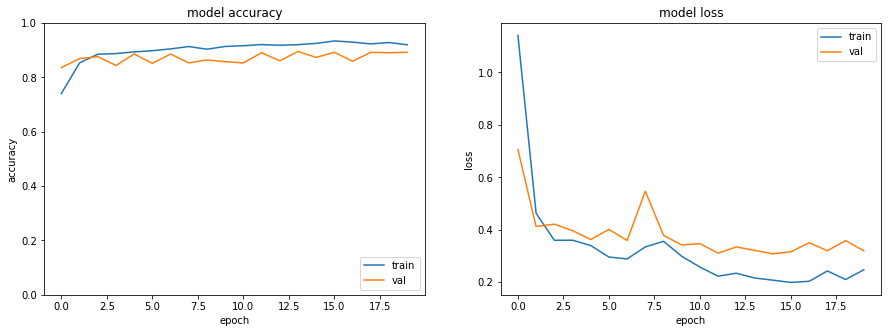

25/25 [==============================] - 0s 1ms/step - loss: 0.3034 - accuracy: 0.8950
Test loss: 0.30342915654182434
Test accuracy: 0.8949999809265137
                precision    recall  f1-score   support

           dog       0.98      0.76      0.86        80
       rooster       0.88      0.55      0.68        80
          rain       0.95      0.97      0.96        80
     sea_waves       0.97      0.95      0.96        80
crackling_fire       0.95      0.96      0.96        80
   crying_baby       0.96      0.94      0.95        80
      sneezing       0.58      0.95      0.72        80
    clock_tick       0.93      0.96      0.94        80
    helicopter       0.97      0.96      0.97        80
      chainsaw       0.99      0.94      0.96        80

      accuracy                           0.90       800
     macro avg       0.92      0.89      0.90       800
  weighted avg       0.92      0.90      0.90       800



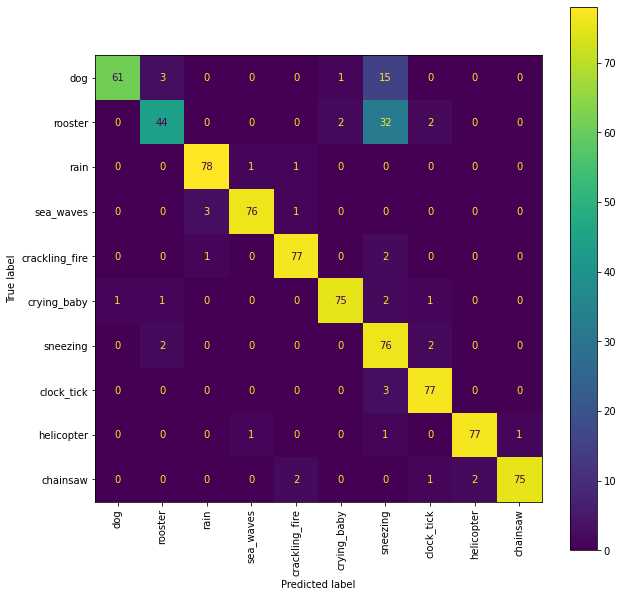

In [111]:
# Load best model
model = tf.keras.models.load_model(checkpoint_path)

# Plot training history
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

# Plot training accuracy history
axs[0].plot(history.history['accuracy'])
axs[0].plot(history.history['val_accuracy'])
axs[0].set_title('model accuracy')
axs[0].set_ylabel('accuracy')
axs[0].set_xlabel('epoch')
axs[0].set_ylim(0,1)
axs[0].legend(['train', 'val'], loc='lower right')

axs[1].plot(history.history['loss'])
axs[1].plot(history.history['val_loss'])
axs[1].set_title('model loss')
axs[1].set_ylabel('loss')
axs[1].set_xlabel('epoch')
axs[1].legend(['train', 'val'], loc='upper right')

plt.show()

test_loss, test_accuracy = model.evaluate(X_test, y_test)

print(f'Test loss: {test_loss}')
print(f'Test accuracy: {test_accuracy}')

y_pred_proba = model.predict(X_test)
y_pred_test = np.array([np.argmax(y) for y in y_pred_proba])
y_true_test = np.array([np.argmax(y) for y in y_test])

# Classification Report
print(classification_report(y_true_test, y_pred_test, target_names=label_names))

# Confusion matrix
fig, ax = plt.subplots(figsize=(10,10))
cmp = ConfusionMatrixDisplay.from_predictions(y_true_test, y_pred_test, display_labels=label_names, xticks_rotation='vertical', ax=ax)
plt.show()

## Summary and further work

<b>Summary</b>
- Spectrograms (incl. Mel) as well as MFCC used as features for a CNN can achieve very good performances on simple datasets (e.g. AudioMNIST)
- Data augmentation clearly improves performance on more difficult datasets with fewer data points (e.g. ESC-10) 
- Many parameter options along the whole pipeline (e.g. spectrogram configurations for feature extraction, augmentation techniques and ranges, neural network architecture, training/optimizer)
- Using pre-trained models can achieve the same performances on ESC-10 dataset, but without the help of data augmentation   

<b>Further work</b>
- Explore other commonly used features in audio classification (Chroma features, Zero Crossing Rate, etc.)
- Use data augmentation on spectrograms (Frequency Masking, etc.) instead only on waveform
- Online augmentation as part of neural network training
- Explore further pre-trained models and build models based on pre-trained spectrograms
- Develop pipelines suitable for larger datasets
- Look into techniques to classify audio that contains multiple classes (i.e. multi-label classification problem), see https://mct-master.github.io/machine-learning/2020/09/20/classifying-urban-sounds.html as an inspiration how to create such a dataset by overlaying audio streams
- Look into algorithms such as YOHO (You Only Hear Once), see https://arxiv.org/abs/2109.00962

## References
- https://towardsdatascience.com/preprocess-audio-data-with-the-signal-envelope-499e6072108
- https://github.com/soerenab/AudioMNIST/blob/master/preprocess_data.py
- https://www.researchgate.net/publication/347356900_Audio_Pre-Processing_For_Deep_Learning
- https://towardsdatascience.com/understanding-audio-data-fourier-transform-fft-spectrogram-and-speech-recognition-a4072d228520
- https://dropsofai.com/sound-wave-basics-every-data-scientist-must-know-before-starting-analysis-on-audio-data/
- https://www.section.io/engineering-education/machine-learning-for-audio-classification/#differences-between-sound-and-audio
- https://www.kdnuggets.com/2020/02/audio-data-analysis-deep-learning-python-part-1.html
- https://medium.com/gradientcrescent/urban-sound-classification-using-convolutional-neural-networks-with-keras-theory-and-486e92785df4
- https://towardsdatascience.com/audio-classification-using-fastai-and-on-the-fly-frequency-transforms-4dbe1b540f89
- https://medium.com/analytics-vidhya/understanding-the-mel-spectrogram-fca2afa2ce53
- https://blog.paperspace.com/introduction-to-audio-analysis-and-synthesis/
- https://www.youtube.com/watch?v=m3XbqfIij_Y (Basics Audio Processing)
- https://www.youtube.com/watch?v=Oa_d-zaUti8 (Preprocessing Audio for Deep Learning)
- https://www.youtube.com/watch?v=szyGiObZymo (Music Genre Classification)
- https://www.tutorialexample.com/understand-n_fft-hop_length-win_length-in-audio-processing-librosa-tutorial/ (hop_lenght, n_fft_, win_length)
- https://towardsdatascience.com/audio-deep-learning-made-simple-sound-classification-step-by-step-cebc936bbe5
- https://colab.research.google.com/github/enzokro/clck10/blob/master/_notebooks/2020-09-10-Normalizing-spectrograms-for-deep-learning.ipynb (Normalize spectrograms)
- https://towardsdatascience.com/audio-deep-learning-made-simple-part-3-data-preparation-and-augmentation-24c6e1f6b52
- https://medium.com/analytics-vidhya/simplifying-audio-data-fft-stft-mfcc-for-machine-learning-and-deep-learning-443a2f962e0e (STFT, MFCC, FFT)
- https://www.nti-audio.com/en/support/know-how/fast-fourier-transform-fft#:~:text=The%20sampling%20rate%20or%20sampling,2%5E10%20%3D%201024%20samples) (FFT parameters)
- https://towardsdatascience.com/all-you-need-to-know-to-start-speech-processing-with-deep-learning-102c916edf62 (Basics)
- https://www.researchgate.net/figure/Performance-chart-of-the-model-in-the-ESC-10-dataset_tbl3_344519283 (Results with ESC-10)
- https://www.tensorflow.org/tutorials/audio/transfer_learning_audio (Transfer Learning based on a Google pre-trained model YAMNet)